# Estimation of tree height using GEDI dataset - Feed forward networks - 2025

In [ ]:
'''
Packages

conda install pytorch torchvision torchaudio cudatoolkit=10.2 -c pytorch
conda install -c anaconda scikit-learn
conda install pandas

NOTE: if you would like to use pytorch with GPU support, run the following command:
conda install -c pytorch -c nvidia pytorch torchvision torchaudio pytorch-cuda=12.1
'''

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import scipy
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from scipy import stats
from scipy.stats import pearsonr


"""
Fix random seeds.
"""
seed=31
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [ ]:
predictors = pd.read_csv("../tree_height/txt/eu_x_y_height_predictors_select.txt", sep=" ",  index_col=False)
pd.set_option('display.max_columns',None)
# change column name
predictors = predictors.rename({'dev-magnitude':'devmagnitude'} , axis='columns')
predictors.head(10)

,ID,X,Y,h,BLDFIE_WeigAver,CECSOL_WeigAver,CHELSA_bio18,CHELSA_bio4,convergence,cti,devmagnitude,eastness,elev,forestheight,glad_ard_SVVI_max,glad_ard_SVVI_med,glad_ard_SVVI_min,northness,ORCDRC_WeigAver,outlet_dist_dw_basin,SBIO3_Isothermality_5_15cm,SBIO4_Temperature_Seasonality_5_15cm,treecover
0,1,6.050001,49.727499,3139.00,1540,13,2113,5893,-10.486560,-238043120,1.158417,0.069094,353.983124,23,276.871094,46.444092,347.665405,0.042500,9,780403,19.798992,440.672211,85
1,2,6.050002,49.922155,1454.75,1491,12,1993,5912,33.274361,-208915344,-1.755341,0.269112,267.511688,19,-49.526367,19.552734,-130.541748,0.182780,16,772777,20.889412,457.756195,85
2,3,6.050002,48.602377,853.50,1521,17,2124,5983,0.045293,-137479792,1.908780,-0.016055,389.751160,21,93.257324,50.743652,384.522461,0.036253,14,898820,20.695877,481.879700,62
3,4,6.050009,48.151979,3141.00,1526,16,2569,6130,-33.654274,-267223072,0.965787,0.067767,380.207703,27,542.401367,202.264160,386.156738,0.005139,15,831824,19.375000,479.410278,85
4,5,6.050010,49.588410,2065.25,1547,14,2108,5923,27.493824,-107809368,-0.162624,0.014065,308.042786,25,136.048340,146.835205,198.127441,0.028847,17,796962,18.777500,457.880066,85
5,6,6.050014,48.608456,1246.50,1515,19,2124,6010,-1.602039,17384282,1.447979,-0.018912,364.527100,18,221.339844,247.387207,480.387939,0.042747,14,897945,19.398880,474.331329,62
6,7,6.050016,48.571401,2938.75,1520,19,2169,6147,27.856503,-66516432,-1.073956,0.002280,254.679596,19,125.250488,87.865234,160.696777,0.037254,11,908426,20.170450,476.414520,96
7,8,6.050019,49.921613,3294.75,1490,12,1995,5912,22.102139,-297770784,-1.402633,0.309765,294.927765,26,-86.729492,-145.584229,-190.062988,0.222435,15,772784,20.855963,457.195404,86
8,9,6.050020,48.822645,1623.50,1554,18,1973,6138,18.496584,-25336536,-0.800016,0.010370,240.493759,22,-51.470703,-245.886719,172.074707,0.004428,8,839132,21.812290,496.231110,64
9,10,6.050024,49.847522,1400.00,1521,15,2187,5886,-5.660453,-278652608,1.477951,-0.068720,376.671143,12,277.297363,273.141846,-138.895996,0.098817,13,768873,21.137711,466.976685,70


In [ ]:
# Filter heights below 7000
mask = predictors['h'] < 7000
predictors_under7k = predictors.loc[mask]

# Sample up to 100k rows (no replacement)
n = min(100000, len(predictors_under7k))
predictors_sel = predictors_under7k.sample(n, replace=False, random_state=0)

# Add height in meters at column index 4
predictors_sel.insert(4, 'hm', predictors_sel['h'] / 100)

# Row count
length_after = len(predictors_sel)
print('row count: {}'.format(length_after))

# Quick preview
head_preview = predictors_sel.head(10)


row count: 100000


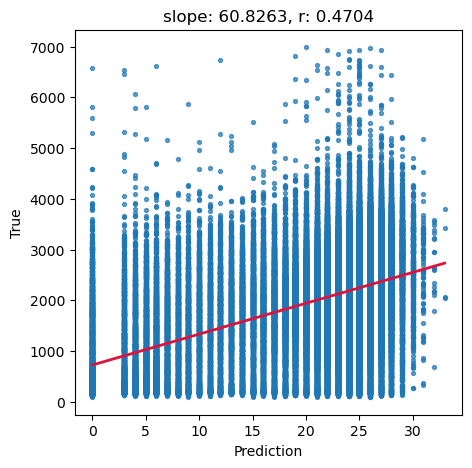

In [ ]:
# Ground truth and predictions
y_true = predictors_sel['h']
y_pred = predictors_sel['forestheight']

# Simple linear regression (y_true ~ y_pred)
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred, y_true)

# Scatter and annotation
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.scatter(y_pred, y_true, s=8, alpha=0.7)
ax.set_xlabel('Prediction')
ax.set_ylabel('True')
ax.set_title('slope: {:.4f}, r: {:.4f}'.format(slope, r_value))

# Optional: add fitted line
xline = np.linspace(y_pred.min(), y_pred.max(), 100)
ax.plot(xline, intercept + slope * xline, color='crimson', lw=2)

plt.show()

In [ ]:
# Target variable (meters) as NumPy array
tree_height_orig = predictors_sel['hm'].to_numpy()

# Feature matrix without ID/targets/pred column
data = predictors_sel.drop(columns=['ID', 'h', 'hm', 'forestheight'], axis=1)


data.shape[1]: 20, n_plots_x: 5, n_plots_y: 4


/tmp/tmp.8i6qKi0XR7/ipykernel_1275115/392271650.py:12: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  ax[idx].hist(data.iloc[:, idx].ravel(), bins=30, color='steelblue', alpha=0.8)


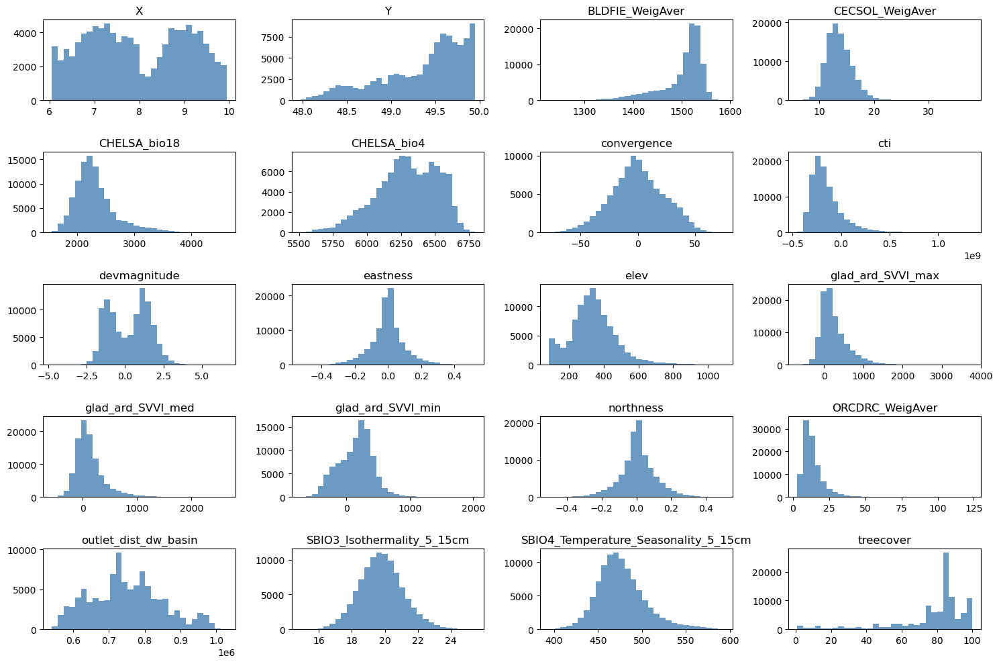

In [ ]:
# Grid size close to square
n_plots_x = int(np.ceil(np.sqrt(data.shape[1])))
n_plots_y = int(np.floor(np.sqrt(data.shape[1])))
print('data.shape[1]: {}, n_plots_x: {}, n_plots_y: {}'.format(data.shape[1], n_plots_x, n_plots_y))

# Subplots and flat axes
fig, ax = plt.subplots(n_plots_x, n_plots_y, figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k')
ax = np.array(ax).ravel()

# Hist per feature (normalized)
for idx in range(data.shape[1]):
    ax[idx].hist(data.iloc[:, idx].ravel(), bins=30, color='steelblue', alpha=0.8)
    ax[idx].set_title(data.columns[idx])

# Tight layout
fig.tight_layout()


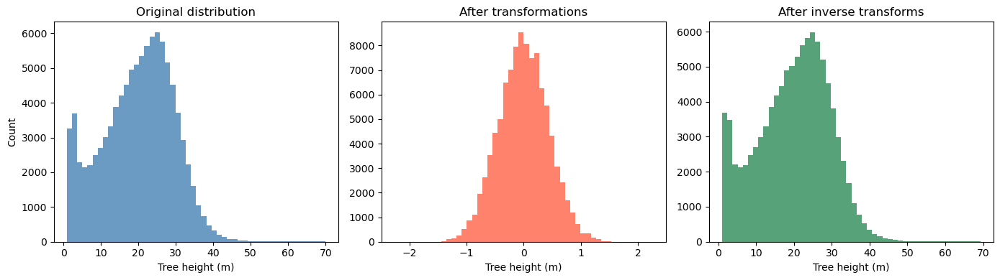

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler

# Suppose tree_height_raw is your original 1D np.array
# Keep a copy for plotting the "before" distribution
x0 = tree_height_orig.copy()

# 1) Fit and apply QuantileTransformer (to normal)
qt = QuantileTransformer(n_quantiles=500, output_distribution="normal", random_state=0)
x1 = qt.fit_transform(x0.reshape(-1, 1))  # shape (n, 1)

# 2) Fit and apply MinMaxScaler to [-1, 1]
scaler_tree = MinMaxScaler(feature_range=(-1, 1))
x2 = scaler_tree.fit_transform(x1)  # shape (n, 1)

# 3) Divide by 99th percentile (elementwise scaling)
q99 = np.quantile(x2.squeeze(), 0.99)
x3 = (x2.squeeze() / q99)  # shape (n,)

# Plot 1: before any transformation
plt.figure(figsize=(14,4))
plt.subplot(1,3,1)
plt.hist(x0, bins=50, color="steelblue", alpha=0.8)
plt.title("Original distribution")
plt.xlabel("Tree height (m)")
plt.ylabel("Count")

# Plot 2: after all transformations (normalized)
plt.subplot(1,3,2)
plt.hist(x3, bins=50, color="tomato", alpha=0.8)
plt.title("After transformations")
plt.xlabel("Tree height (m)")

# ---- Inversion pipeline ----
# Inverse of step 3: multiply by q99, then reshape for scaler.inverse_transform
x2_rec = (x3 * q99).reshape(-1, 1)

# Inverse of step 2: MinMaxScaler inverse
x1_rec = scaler_tree.inverse_transform(x2_rec)  # shape (n, 1)

# Inverse of step 1: QuantileTransformer inverse
x0_rec = qt.inverse_transform(x1_rec).squeeze()  # shape (n,)

# Plot 3: after inverting all transformations
plt.subplot(1,3,3)
plt.hist(x0_rec, bins=50, color="seagreen", alpha=0.8)
plt.title("After inverse transforms")
plt.xlabel("Tree height (m)")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler

def inverse_normalization(transformed_data, qt, scaler_tree, q99):
    """
    Inverse the normalization operations.

    Args:
        transformed_data (ndarray): Transformed data.
        qt (QuantileTransformer): QuantileTransformer instance used for transformation.
        scaler_tree (MinMaxScaler): MinMaxScaler instance used for transformation.
        q99 (float): Value at the 99th percentile of the original data.

    Returns:
        ndarray: Inverse transformed data.
    """
    # Inverse of step 3: multiply by q99, then reshape for scaler.inverse_transform
    x2_rec = (transformed_data * q99).reshape(-1, 1)

    # Inverse of step 2: MinMaxScaler inverse
    x1_rec = scaler_tree.inverse_transform(x2_rec)  # shape (n, 1)

    # Inverse of step 1: QuantileTransformer inverse
    x0_rec = qt.inverse_transform(x1_rec).squeeze()  # shape (n,)

    return x0_rec

# Example usage
# qt = QuantileTransformer(n_quantiles=500, output_distribution="normal", random_state=0)
# scaler_tree = MinMaxScaler(feature_range=(-1, 1))
# q99 = np.quantile(tree_height, 0.99)

# transformed_data = qt.fit_transform(tree_height.reshape(-1, 1))
# x0_rec = inverse_normalization(transformed_data, qt, scaler_tree, q99)

# # Plot the inverse transformed data
# plt.hist(x0_rec, bins=50, color="seagreen", alpha=0.8)
# plt.title("After inverse transforms")
# plt.xlabel("Tree height (m)")
# plt.show()

data.shape[1]: 20, n_plots_x: 5, n_plots_y: 4


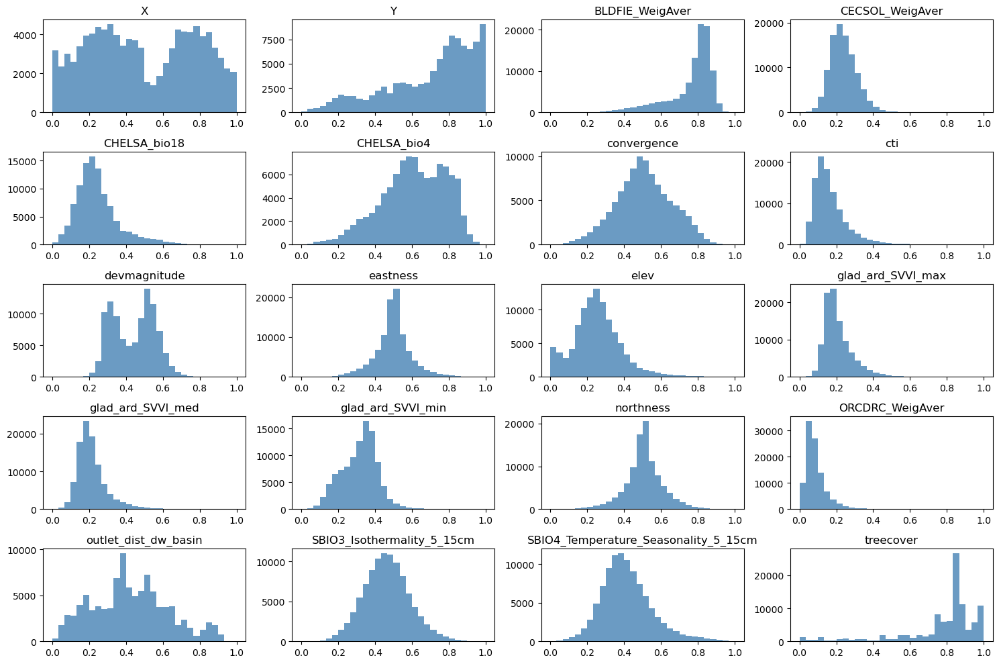

In [ ]:
# Normalize features to [0, 1]
scaler_data = MinMaxScaler()
data_transformed = scaler_data.fit_transform(data)

# Grid size (near-square)
n_plots_x = int(np.ceil(np.sqrt(data.shape[1])))
n_plots_y = int(np.floor(np.sqrt(data.shape[1])))
print('data.shape[1]: {}, n_plots_x: {}, n_plots_y: {}'.format(data.shape[1], n_plots_x, n_plots_y))

# Subplots and flat axes
fig, ax = plt.subplots(n_plots_x, n_plots_y, figsize=(15, 10), dpi=100, facecolor='w', edgecolor='k')
ax = np.array(ax).ravel()

# Hist per feature (normalized)
for idx in range(data.shape[1]):
    ax[idx].hist(data_transformed[:, idx].ravel(), bins=30, color='steelblue', alpha=0.8)
    ax[idx].set_title(data.columns[idx])

# Layout
fig.tight_layout()


In [ ]:
# Let's use all the data as one big minibatch
tree_height = x3.copy() # We will the normalized tree_height

#Split the data
X_train, X_test, y_train, y_test = train_test_split(data_transformed,tree_height, test_size=0.30, random_state=0)
X_train = torch.FloatTensor(X_train)
y_train = torch.FloatTensor(y_train)
X_test = torch.FloatTensor(X_test)
y_test = torch.FloatTensor(y_test)
print('X_train.shape: {}, X_test.shape: {}, y_train.shape: {}, y_test.shape: {}'.format(X_train.shape, X_test.shape, y_train.shape, y_test.shape))
print('X_train.min: {}, X_test.min: {}, y_train.min: {}, y_test.min: {}'.format(X_train.min(), X_test.min(), y_train.min(), y_test.min()))
print('X_train.max: {}, X_test.max: {}, y_train.max: {}, y_test.max: {}'.format(X_train.max(), X_test.max(), y_train.max(), y_test.max()))

X_train.shape: torch.Size([70000, 20]), X_test.shape: torch.Size([30000, 20]), y_train.shape: torch.Size([70000]), y_test.shape: torch.Size([30000])
X_train.min: 0.0, X_test.min: 0.0, y_train.min: -2.261296272277832, y_test.min: -2.261296272277832
X_train.max: 1.0, X_test.max: 1.0, y_train.max: 2.261296272277832, y_test.max: 2.261296272277832


In [ ]:
# Try with FF
class Feedforward(torch.nn.Module):
    def __init__(self, input_size, hidden_size):
        super(Feedforward, self).__init__()
        self.input_size = input_size
        self.hidden_size  = hidden_size
        self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
        self.fc2 = torch.nn.Linear(self.hidden_size, self.hidden_size)
        self.relu = torch.nn.ReLU()
        self.fc3 = torch.nn.Linear(self.hidden_size, 1)
        self.sigmoid = torch.nn.Sigmoid()
        self.tanh = torch.nn.Tanh()
    def forward(self, x):
        hidden = self.relu(self.fc1(x))
        hidden = self.relu(self.fc2(hidden))
        output = self.tanh(self.fc3(hidden))

        return output


hid_dim: 128, lr: 0.75
Epoch 0, train_loss: 0.2017, val_loss: 0.2907, r_value: 0.1826


Epoch 500, train_loss: 0.1589, val_loss: 0.1637, r_value: 0.4344
Epoch 1000, train_loss: 0.1554, val_loss: 0.1595, r_value: 0.4567
Epoch 1500, train_loss: 0.1526, val_loss: 0.1563, r_value: 0.4695
Epoch 2000, train_loss: 0.1500, val_loss: 0.1541, r_value: 0.4788
Epoch 2500, train_loss: 0.1481, val_loss: 0.1554, r_value: 0.4740
Epoch 3000, train_loss: 0.1460, val_loss: 0.1519, r_value: 0.4848
Epoch 3500, train_loss: 0.1449, val_loss: 0.1512, r_value: 0.4880
Epoch 4000, train_loss: 0.1438, val_loss: 0.1505, r_value: 0.4910
Epoch 4500, train_loss: 0.1429, val_loss: 0.1499, r_value: 0.4935
Epoch 5000, train_loss: 0.1420, val_loss: 0.1492, r_value: 0.4959
Epoch 5500, train_loss: 0.1414, val_loss: 0.1487, r_value: 0.4979
Epoch 6000, train_loss: 0.1409, val_loss: 0.1483, r_value: 0.4998
Epoch 6500, train_loss: 0.1404, val_loss: 0.1479, r_value: 0.5016
Epoch 7000, train_loss: 0.1400, val_loss: 0.1475, r_value: 0.5034
Epoch 7500, train_loss: 0.1398, val_loss: 0.1472, r_value: 0.5049
Epoch 8000,

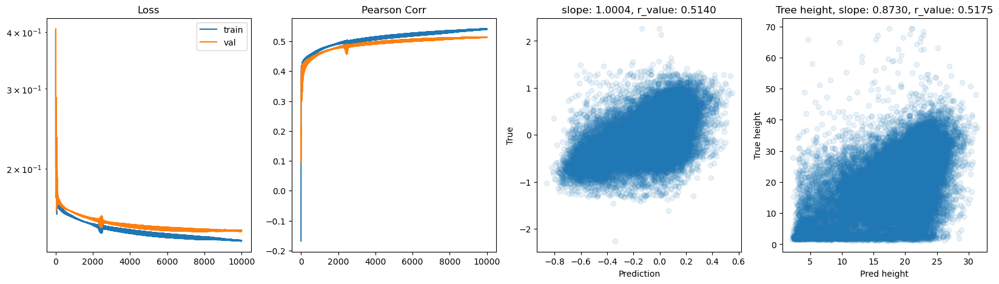


hid_dim: 128, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1908, val_loss: 0.2017, r_value: 0.2880
Epoch 500, train_loss: 0.1513, val_loss: 0.1555, r_value: 0.4483
Epoch 1000, train_loss: 0.1478, val_loss: 0.1515, r_value: 0.4695
Epoch 1500, train_loss: 0.1452, val_loss: 0.1492, r_value: 0.4798
Epoch 2000, train_loss: 0.1435, val_loss: 0.1478, r_value: 0.4867
Epoch 2500, train_loss: 0.1422, val_loss: 0.1468, r_value: 0.4918
Epoch 3000, train_loss: 0.1389, val_loss: 0.1442, r_value: 0.4922
Epoch 3500, train_loss: 0.1416, val_loss: 0.1464, r_value: 0.5017
Epoch 4000, train_loss: 0.1403, val_loss: 0.1451, r_value: 0.5044
Epoch 4500, train_loss: 0.1392, val_loss: 0.1444, r_value: 0.5044
Epoch 5000, train_loss: 0.1386, val_loss: 0.1436, r_value: 0.5090
Epoch 5500, train_loss: 0.1386, val_loss: 0.1439, r_value: 0.5106
Epoch 6000, train_loss: 0.1385, val_loss: 0.1440, r_value: 0.5120
Epoch 6500, train_loss: 0.1375, val_loss: 0.1430, r_value: 0.5134
Epoch 7000, train_loss: 0.1371, v

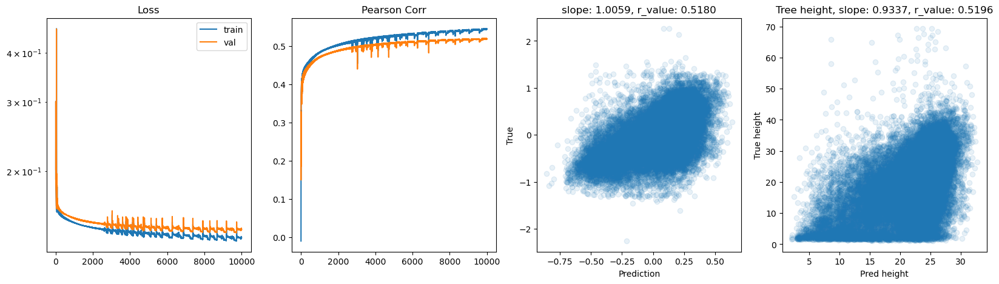


hid_dim: 128, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1950, val_loss: 0.1912, r_value: -0.0032
Epoch 500, train_loss: 0.1504, val_loss: 0.1535, r_value: 0.4375
Epoch 1000, train_loss: 0.1486, val_loss: 0.1518, r_value: 0.4474
Epoch 1500, train_loss: 0.1478, val_loss: 0.1510, r_value: 0.4533
Epoch 2000, train_loss: 0.1470, val_loss: 0.1503, r_value: 0.4579
Epoch 2500, train_loss: 0.1462, val_loss: 0.1496, r_value: 0.4622
Epoch 3000, train_loss: 0.1456, val_loss: 0.1490, r_value: 0.4663
Epoch 3500, train_loss: 0.1449, val_loss: 0.1483, r_value: 0.4702
Epoch 4000, train_loss: 0.1442, val_loss: 0.1477, r_value: 0.4740
Epoch 4500, train_loss: 0.1436, val_loss: 0.1472, r_value: 0.4772
Epoch 5000, train_loss: 0.1431, val_loss: 0.1467, r_value: 0.4800
Epoch 5500, train_loss: 0.1426, val_loss: 0.1463, r_value: 0.4826
Epoch 6000, train_loss: 0.1421, val_loss: 0.1458, r_value: 0.4850
Epoch 6500, train_loss: 0.1416, val_loss: 0.1454, r_value: 0.4873
Epoch 7000, train_loss: 0.1412, 

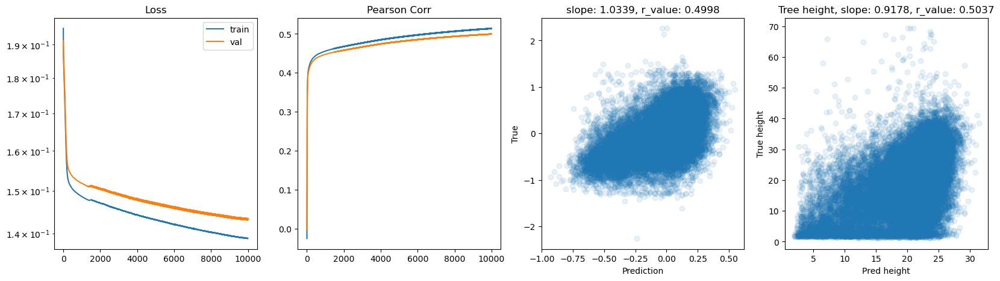


hid_dim: 128, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1848, val_loss: 0.1867, r_value: 0.3454
Epoch 500, train_loss: 0.1729, val_loss: 0.1753, r_value: 0.3916
Epoch 1000, train_loss: 0.1621, val_loss: 0.1647, r_value: 0.4077
Epoch 1500, train_loss: 0.1559, val_loss: 0.1587, r_value: 0.4169
Epoch 2000, train_loss: 0.1533, val_loss: 0.1563, r_value: 0.4236
Epoch 2500, train_loss: 0.1521, val_loss: 0.1552, r_value: 0.4282
Epoch 3000, train_loss: 0.1514, val_loss: 0.1545, r_value: 0.4316
Epoch 3500, train_loss: 0.1508, val_loss: 0.1540, r_value: 0.4343
Epoch 4000, train_loss: 0.1504, val_loss: 0.1536, r_value: 0.4367
Epoch 4500, train_loss: 0.1501, val_loss: 0.1533, r_value: 0.4387
Epoch 5000, train_loss: 0.1497, val_loss: 0.1530, r_value: 0.4405
Epoch 5500, train_loss: 0.1495, val_loss: 0.1527, r_value: 0.4421
Epoch 6000, train_loss: 0.1492, val_loss: 0.1525, r_value: 0.4435
Epoch 6500, train_loss: 0.1490, val_loss: 0.1523, r_value: 0.4448
Epoch 7000, train_loss: 0.1488, 

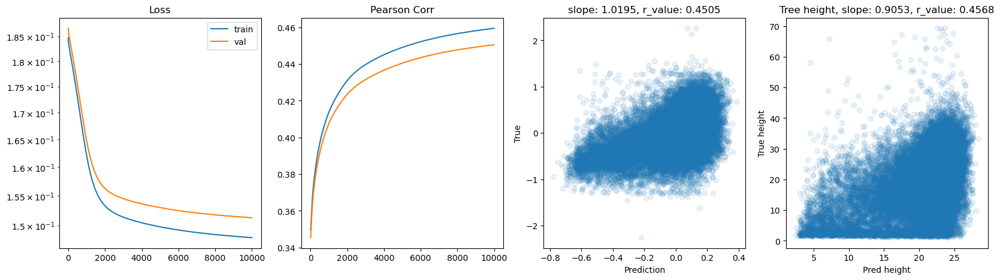


hid_dim: 256, lr: 0.75
Deleting previous model
Epoch 0, train_loss: 0.1895, val_loss: 0.2465, r_value: 0.3170
Epoch 500, train_loss: 0.1606, val_loss: 0.1631, r_value: 0.4545
Epoch 1000, train_loss: 0.1546, val_loss: 0.1586, r_value: 0.4739
Epoch 1500, train_loss: 0.1510, val_loss: 0.1555, r_value: 0.4849
Epoch 2000, train_loss: 0.1497, val_loss: 0.1545, r_value: 0.4897
Epoch 2500, train_loss: 0.1451, val_loss: 0.1497, r_value: 0.4963
Epoch 3000, train_loss: 0.1442, val_loss: 0.1491, r_value: 0.5008
Epoch 3500, train_loss: 0.1453, val_loss: 0.1497, r_value: 0.4995
Epoch 4000, train_loss: 0.1446, val_loss: 0.1490, r_value: 0.5025
Epoch 4500, train_loss: 0.1438, val_loss: 0.1484, r_value: 0.5053
Epoch 5000, train_loss: 0.1430, val_loss: 0.1477, r_value: 0.5079
Epoch 5500, train_loss: 0.1422, val_loss: 0.1471, r_value: 0.5104
Epoch 6000, train_loss: 0.1414, val_loss: 0.1467, r_value: 0.5123
Epoch 6500, train_loss: 0.1407, val_loss: 0.1463, r_value: 0.5139
Epoch 7000, train_loss: 0.1393, 

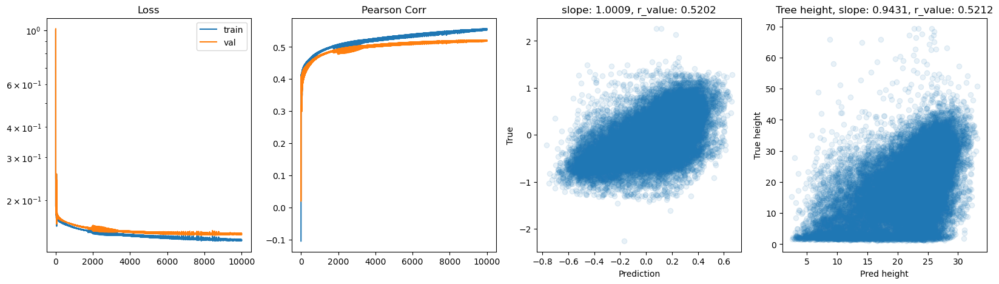


hid_dim: 256, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1924, val_loss: 0.2624, r_value: -0.0000
Epoch 500, train_loss: 0.1520, val_loss: 0.1549, r_value: 0.4582
Epoch 1000, train_loss: 0.1472, val_loss: 0.1511, r_value: 0.4762
Epoch 1500, train_loss: 0.1447, val_loss: 0.1491, r_value: 0.4858
Epoch 2000, train_loss: 0.1432, val_loss: 0.1477, r_value: 0.4933
Epoch 2500, train_loss: 0.1419, val_loss: 0.1464, r_value: 0.4994
Epoch 3000, train_loss: 0.1408, val_loss: 0.1453, r_value: 0.5038
Epoch 3500, train_loss: 0.1401, val_loss: 0.1448, r_value: 0.5070
Epoch 4000, train_loss: 0.1388, val_loss: 0.1437, r_value: 0.5096
Epoch 4500, train_loss: 0.1378, val_loss: 0.1429, r_value: 0.5116
Epoch 5000, train_loss: 0.1353, val_loss: 0.1411, r_value: 0.5131
Epoch 5500, train_loss: 0.1384, val_loss: 0.1442, r_value: 0.5147
Epoch 6000, train_loss: 0.1373, val_loss: 0.1433, r_value: 0.5160
Epoch 6500, train_loss: 0.1333, val_loss: 0.1396, r_value: 0.5160
Epoch 7000, train_loss: 0.1344, 

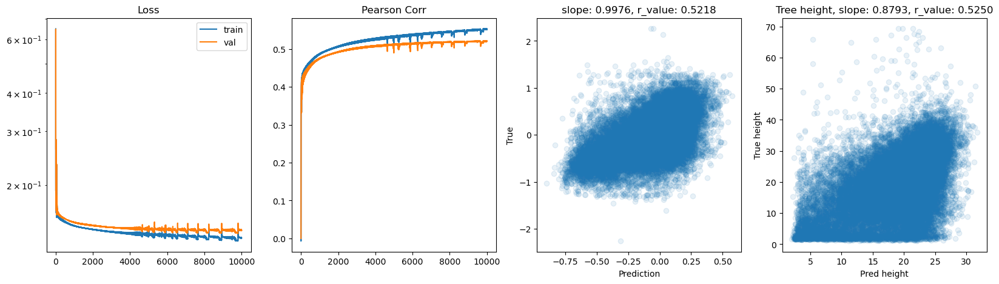


hid_dim: 256, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1862, val_loss: 0.1876, r_value: 0.1682
Epoch 500, train_loss: 0.1505, val_loss: 0.1537, r_value: 0.4415
Epoch 1000, train_loss: 0.1487, val_loss: 0.1520, r_value: 0.4511
Epoch 1500, train_loss: 0.1475, val_loss: 0.1510, r_value: 0.4574
Epoch 2000, train_loss: 0.1465, val_loss: 0.1501, r_value: 0.4626
Epoch 2500, train_loss: 0.1457, val_loss: 0.1494, r_value: 0.4673
Epoch 3000, train_loss: 0.1448, val_loss: 0.1486, r_value: 0.4717
Epoch 3500, train_loss: 0.1440, val_loss: 0.1478, r_value: 0.4757
Epoch 4000, train_loss: 0.1434, val_loss: 0.1473, r_value: 0.4793
Epoch 4500, train_loss: 0.1427, val_loss: 0.1467, r_value: 0.4826
Epoch 5000, train_loss: 0.1421, val_loss: 0.1462, r_value: 0.4856
Epoch 5500, train_loss: 0.1415, val_loss: 0.1457, r_value: 0.4883
Epoch 6000, train_loss: 0.1409, val_loss: 0.1452, r_value: 0.4909
Epoch 6500, train_loss: 0.1404, val_loss: 0.1448, r_value: 0.4933
Epoch 7000, train_loss: 0.1399, v

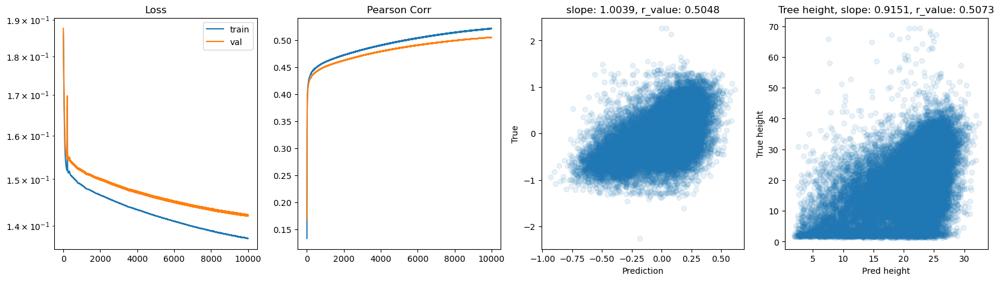


hid_dim: 256, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1958, val_loss: 0.1973, r_value: -0.1141
Epoch 500, train_loss: 0.1711, val_loss: 0.1736, r_value: 0.4022
Epoch 1000, train_loss: 0.1591, val_loss: 0.1619, r_value: 0.4160
Epoch 1500, train_loss: 0.1539, val_loss: 0.1569, r_value: 0.4235
Epoch 2000, train_loss: 0.1522, val_loss: 0.1552, r_value: 0.4288
Epoch 2500, train_loss: 0.1513, val_loss: 0.1544, r_value: 0.4324
Epoch 3000, train_loss: 0.1508, val_loss: 0.1539, r_value: 0.4353
Epoch 3500, train_loss: 0.1503, val_loss: 0.1535, r_value: 0.4377
Epoch 4000, train_loss: 0.1500, val_loss: 0.1531, r_value: 0.4398
Epoch 4500, train_loss: 0.1496, val_loss: 0.1528, r_value: 0.4416
Epoch 5000, train_loss: 0.1493, val_loss: 0.1525, r_value: 0.4432
Epoch 5500, train_loss: 0.1491, val_loss: 0.1523, r_value: 0.4446
Epoch 6000, train_loss: 0.1489, val_loss: 0.1521, r_value: 0.4459
Epoch 6500, train_loss: 0.1487, val_loss: 0.1519, r_value: 0.4470
Epoch 7000, train_loss: 0.1485,

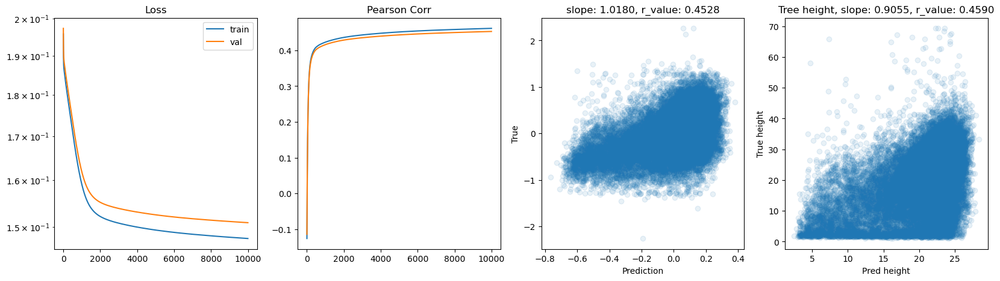


hid_dim: 512, lr: 0.75
Deleting previous model
Epoch 0, train_loss: 0.2013, val_loss: 0.9047, r_value: -0.0687
Epoch 500, train_loss: 0.1613, val_loss: 0.1642, r_value: 0.4547
Epoch 1000, train_loss: 0.1544, val_loss: 0.1584, r_value: 0.4757
Epoch 1500, train_loss: 0.1509, val_loss: 0.1554, r_value: 0.4863
Epoch 2000, train_loss: 0.1487, val_loss: 0.1535, r_value: 0.4947
Epoch 2500, train_loss: 0.1471, val_loss: 0.1518, r_value: 0.4963
Epoch 3000, train_loss: 0.1460, val_loss: 0.1505, r_value: 0.5000
Epoch 3500, train_loss: 0.1450, val_loss: 0.1496, r_value: 0.5031
Epoch 4000, train_loss: 0.1441, val_loss: 0.1489, r_value: 0.5062
Epoch 4500, train_loss: 0.1433, val_loss: 0.1483, r_value: 0.5091
Epoch 5000, train_loss: 0.1426, val_loss: 0.1478, r_value: 0.5115
Epoch 5500, train_loss: 0.1419, val_loss: 0.1475, r_value: 0.5137
Epoch 6000, train_loss: 0.1412, val_loss: 0.1472, r_value: 0.5154
Epoch 6500, train_loss: 0.1407, val_loss: 0.1470, r_value: 0.5168
Epoch 7000, train_loss: 0.1401,

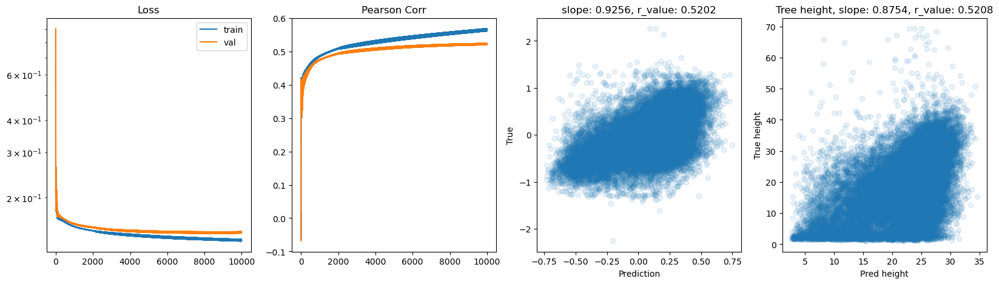


hid_dim: 512, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1877, val_loss: 0.2862, r_value: 0.2483
Epoch 500, train_loss: 0.1513, val_loss: 0.1551, r_value: 0.4532
Epoch 1000, train_loss: 0.1469, val_loss: 0.1504, r_value: 0.4742
Epoch 1500, train_loss: 0.1443, val_loss: 0.1481, r_value: 0.4852
Epoch 2000, train_loss: 0.1425, val_loss: 0.1467, r_value: 0.4933
Epoch 2500, train_loss: 0.1409, val_loss: 0.1456, r_value: 0.4992
Epoch 3000, train_loss: 0.1397, val_loss: 0.1448, r_value: 0.5035
Epoch 3500, train_loss: 0.1387, val_loss: 0.1441, r_value: 0.5069
Epoch 4000, train_loss: 0.1379, val_loss: 0.1436, r_value: 0.5098
Epoch 4500, train_loss: 0.1376, val_loss: 0.1436, r_value: 0.5124
Epoch 5000, train_loss: 0.1369, val_loss: 0.1430, r_value: 0.5141
Epoch 5500, train_loss: 0.1372, val_loss: 0.1437, r_value: 0.5160
Epoch 6000, train_loss: 0.1374, val_loss: 0.1438, r_value: 0.5173
Epoch 6500, train_loss: 0.1351, val_loss: 0.1421, r_value: 0.5185
Epoch 7000, train_loss: 0.1346, v

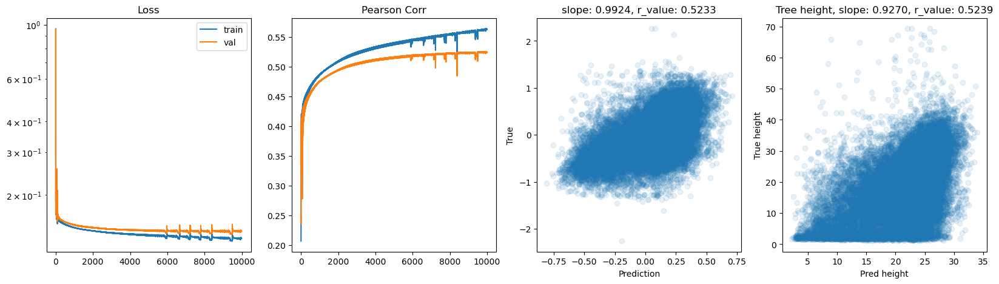


hid_dim: 512, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1903, val_loss: 0.1893, r_value: 0.1326
Epoch 500, train_loss: 0.1493, val_loss: 0.1523, r_value: 0.4482
Epoch 1000, train_loss: 0.1474, val_loss: 0.1506, r_value: 0.4571
Epoch 1500, train_loss: 0.1462, val_loss: 0.1495, r_value: 0.4637
Epoch 2000, train_loss: 0.1452, val_loss: 0.1486, r_value: 0.4695
Epoch 2500, train_loss: 0.1443, val_loss: 0.1478, r_value: 0.4745
Epoch 3000, train_loss: 0.1435, val_loss: 0.1470, r_value: 0.4790
Epoch 3500, train_loss: 0.1427, val_loss: 0.1463, r_value: 0.4830
Epoch 4000, train_loss: 0.1420, val_loss: 0.1457, r_value: 0.4866
Epoch 4500, train_loss: 0.1413, val_loss: 0.1451, r_value: 0.4900
Epoch 5000, train_loss: 0.1406, val_loss: 0.1445, r_value: 0.4932
Epoch 5500, train_loss: 0.1399, val_loss: 0.1439, r_value: 0.4961
Epoch 6000, train_loss: 0.1394, val_loss: 0.1434, r_value: 0.4988
Epoch 6500, train_loss: 0.1388, val_loss: 0.1430, r_value: 0.5012
Epoch 7000, train_loss: 0.1383, v

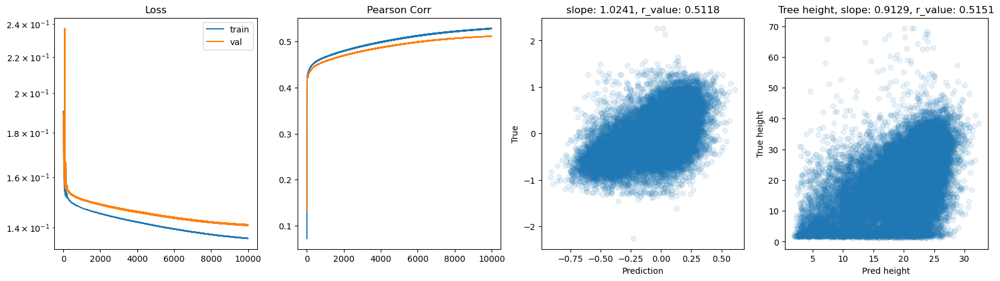


hid_dim: 512, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1899, val_loss: 0.1911, r_value: 0.0675
Epoch 500, train_loss: 0.1585, val_loss: 0.1613, r_value: 0.4214
Epoch 1000, train_loss: 0.1524, val_loss: 0.1554, r_value: 0.4294
Epoch 1500, train_loss: 0.1510, val_loss: 0.1540, r_value: 0.4350
Epoch 2000, train_loss: 0.1503, val_loss: 0.1533, r_value: 0.4387
Epoch 2500, train_loss: 0.1498, val_loss: 0.1528, r_value: 0.4414
Epoch 3000, train_loss: 0.1494, val_loss: 0.1525, r_value: 0.4435
Epoch 3500, train_loss: 0.1491, val_loss: 0.1522, r_value: 0.4451
Epoch 4000, train_loss: 0.1488, val_loss: 0.1520, r_value: 0.4465
Epoch 4500, train_loss: 0.1486, val_loss: 0.1517, r_value: 0.4478
Epoch 5000, train_loss: 0.1484, val_loss: 0.1516, r_value: 0.4489
Epoch 5500, train_loss: 0.1482, val_loss: 0.1514, r_value: 0.4499
Epoch 6000, train_loss: 0.1480, val_loss: 0.1512, r_value: 0.4508
Epoch 6500, train_loss: 0.1478, val_loss: 0.1511, r_value: 0.4517
Epoch 7000, train_loss: 0.1477, 

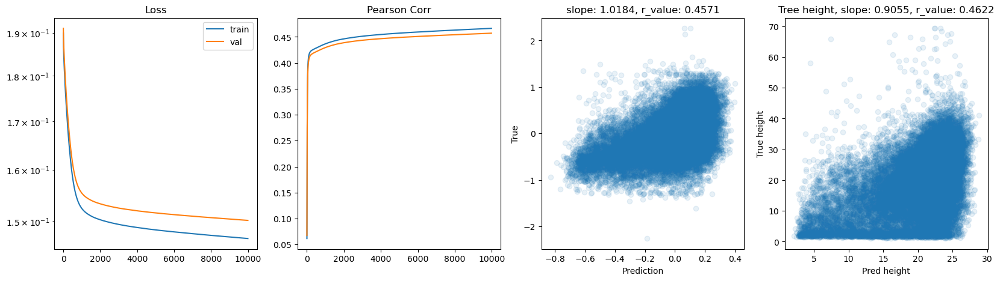

In [ ]:
# model.train()
epoch = 10000
hid_dim_range = [128,256,512]
lr_range = [0.75,0.5,0.1,0.01]

for hid_dim in hid_dim_range:
    for lr in lr_range:
        print('\nhid_dim: {}, lr: {}'.format(hid_dim, lr))
        if 'model' in globals():
            print('Deleting previous model')
            del model, criterion, optimizer
        model = Feedforward(data.shape[1], hid_dim).to(device)
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.SGD(model.parameters(), lr = lr)

        all_loss_train=[]
        all_loss_val=[]
        all_r_train=[]
        all_r_val=[]

        for epoch in range(epoch):
            model.train()
            optimizer.zero_grad()
            # Forward pass
            y_pred = model(X_train.to(device))
            # Compute Loss
            loss = criterion(y_pred.squeeze(), y_train.to(device))

            # Backward pass
            loss.backward()
            optimizer.step()

            all_loss_train.append(loss.item())
            y_pred = y_pred.cpu().detach().numpy().squeeze()
            _, _, r_value_train, _, _ = scipy.stats.linregress(y_pred, y_train)
            all_r_train.append(r_value_train)

            model.eval()
            with torch.no_grad():
                y_pred = model(X_test.to(device))
                # Compute Loss
                loss = criterion(y_pred.squeeze(), y_test.to(device))
                all_loss_val.append(loss.item())

                y_pred = y_pred.cpu().detach().numpy().squeeze()
                slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred, y_test)
                all_r_val.append(r_value)
                # r_value2 = pearsonr(y_pred, y_test)[0]

                if epoch%500==0:
                    print('Epoch {}, train_loss: {:.4f}, val_loss: {:.4f}, r_value: {:.4f}'.format(epoch,all_loss_train[-1],all_loss_val[-1],r_value))

        fig,ax=plt.subplots(1,4,figsize=(20,5))
        ax[0].plot(all_loss_train)
        ax[0].plot(all_loss_val)
        ax[0].semilogy()
        ax[0].set_title('Loss')
        ax[0].legend(['train','val'])

        ax[1].plot(all_r_train)
        ax[1].plot(all_r_val)
        ax[1].set_title('Pearson Corr')

        ax[2].scatter(y_pred, y_test.cpu(), alpha=0.1)
        ax[2].set_xlabel('Prediction')
        ax[2].set_ylabel('True')
        ax[2].set_title('slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))

        # Inverse the transformations back to the tree height
        # Inverse of step 3: multiply by q99, then reshape for scaler.inverse_transform
        tree_height_reversed = inverse_normalization(y_test.cpu().reshape(-1, 1), qt, scaler_tree, q99)
        pred_tree_heigth_reversed = inverse_normalization(y_pred.reshape(-1, 1), qt, scaler_tree, q99)
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(pred_tree_heigth_reversed, tree_height_reversed)
        ax[3].scatter(pred_tree_heigth_reversed, tree_height_reversed, alpha=0.1)
        ax[3].set_xlabel('Pred height')
        ax[3].set_ylabel('True height')
        ax[3].set_title('Tree height, slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))

        plt.show()

In [ ]:
# Try deeper FF
class Feedforward(torch.nn.Module):
    def __init__(self, input_size, hidden_size):
        super(Feedforward, self).__init__()
        self.input_size = input_size
        self.hidden_size  = hidden_size
        self.fc1 = torch.nn.Linear(self.input_size, self.hidden_size)
        self.fc2 = torch.nn.Linear(self.hidden_size, self.hidden_size)
        self.fc3 = torch.nn.Linear(self.hidden_size, self.hidden_size)
        self.fc4 = torch.nn.Linear(self.hidden_size, self.hidden_size)
        self.relu = torch.nn.ReLU()
        self.fc5 = torch.nn.Linear(self.hidden_size, 1)
        self.sigmoid = torch.nn.Sigmoid()
        self.tanh = torch.nn.Tanh()
    def forward(self, x):
        hidden = self.relu(self.fc1(x))
        hidden = self.relu(self.fc2(hidden))
        hidden = self.relu(self.fc3(hidden))
        hidden = self.relu(self.fc4(hidden))
        output = self.tanh(self.fc5(hidden))

        return output


hid_dim: 128, lr: 0.75
Deleting previous model
Epoch 0, train_loss: 0.1913, val_loss: 0.1937, r_value: 0.0633


Epoch 500, train_loss: 0.1597, val_loss: 0.1667, r_value: 0.4110
Epoch 1000, train_loss: 0.1577, val_loss: 0.1634, r_value: 0.4276
Epoch 1500, train_loss: 0.1570, val_loss: 0.1617, r_value: 0.4410
Epoch 2000, train_loss: 0.1563, val_loss: 0.1605, r_value: 0.4521
Epoch 2500, train_loss: 0.1550, val_loss: 0.1587, r_value: 0.4618
Epoch 3000, train_loss: 0.1535, val_loss: 0.1571, r_value: 0.4685
Epoch 3500, train_loss: 0.1524, val_loss: 0.1560, r_value: 0.4742
Epoch 4000, train_loss: 0.1518, val_loss: 0.1555, r_value: 0.4786
Epoch 4500, train_loss: 0.1519, val_loss: 0.1569, r_value: 0.4824
Epoch 5000, train_loss: 0.1468, val_loss: 0.1524, r_value: 0.4876
Epoch 5500, train_loss: 0.1497, val_loss: 0.1540, r_value: 0.4814
Epoch 6000, train_loss: 0.1413, val_loss: 0.1475, r_value: 0.4944
Epoch 6500, train_loss: 0.1456, val_loss: 0.1542, r_value: 0.4722
Epoch 7000, train_loss: 0.1475, val_loss: 0.1545, r_value: 0.4812
Epoch 7500, train_loss: 0.1375, val_loss: 0.1429, r_value: 0.5004
Epoch 8000,

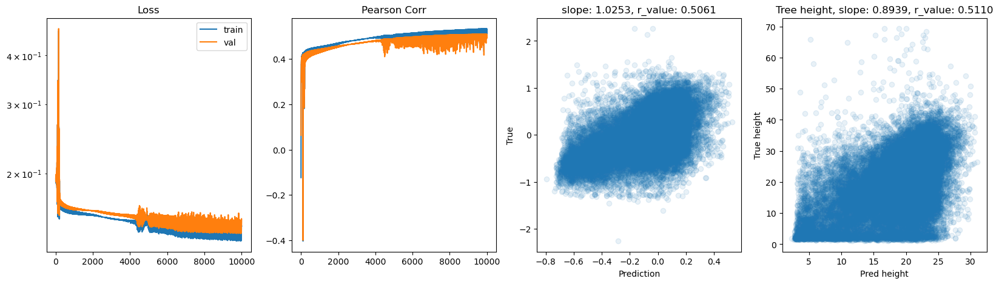


hid_dim: 128, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1927, val_loss: 0.1909, r_value: 0.0507
Epoch 500, train_loss: 0.1555, val_loss: 0.1574, r_value: 0.4403
Epoch 1000, train_loss: 0.1519, val_loss: 0.1550, r_value: 0.4501
Epoch 1500, train_loss: 0.1503, val_loss: 0.1540, r_value: 0.4592
Epoch 2000, train_loss: 0.1486, val_loss: 0.1530, r_value: 0.4664
Epoch 2500, train_loss: 0.1472, val_loss: 0.1519, r_value: 0.4715
Epoch 3000, train_loss: 0.1462, val_loss: 0.1511, r_value: 0.4764
Epoch 3500, train_loss: 0.1452, val_loss: 0.1502, r_value: 0.4814
Epoch 4000, train_loss: 0.1442, val_loss: 0.1494, r_value: 0.4863
Epoch 4500, train_loss: 0.1428, val_loss: 0.1467, r_value: 0.4911
Epoch 5000, train_loss: 0.1416, val_loss: 0.1473, r_value: 0.4955
Epoch 5500, train_loss: 0.1407, val_loss: 0.1456, r_value: 0.4985
Epoch 6000, train_loss: 0.1407, val_loss: 0.1464, r_value: 0.5003
Epoch 6500, train_loss: 0.1395, val_loss: 0.1448, r_value: 0.5010
Epoch 7000, train_loss: 0.1376, v

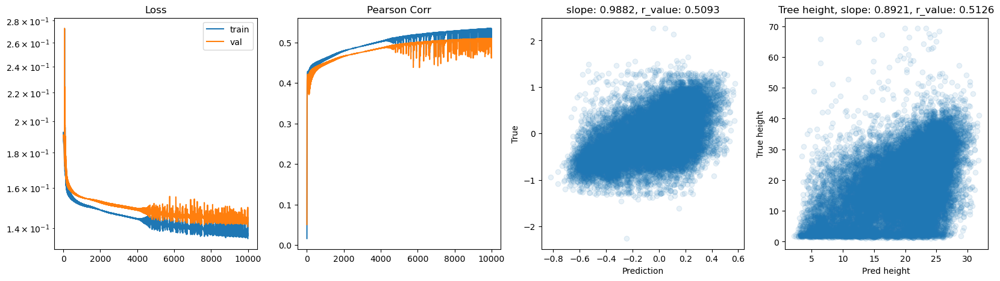


hid_dim: 128, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1944, val_loss: 0.1936, r_value: 0.0185
Epoch 500, train_loss: 0.1517, val_loss: 0.1549, r_value: 0.4291
Epoch 1000, train_loss: 0.1498, val_loss: 0.1532, r_value: 0.4474
Epoch 1500, train_loss: 0.1486, val_loss: 0.1521, r_value: 0.4530
Epoch 2000, train_loss: 0.1478, val_loss: 0.1513, r_value: 0.4574
Epoch 2500, train_loss: 0.1470, val_loss: 0.1506, r_value: 0.4618
Epoch 3000, train_loss: 0.1463, val_loss: 0.1499, r_value: 0.4661
Epoch 3500, train_loss: 0.1456, val_loss: 0.1494, r_value: 0.4703
Epoch 4000, train_loss: 0.1449, val_loss: 0.1488, r_value: 0.4740
Epoch 4500, train_loss: 0.1442, val_loss: 0.1483, r_value: 0.4771
Epoch 5000, train_loss: 0.1437, val_loss: 0.1478, r_value: 0.4799
Epoch 5500, train_loss: 0.1431, val_loss: 0.1473, r_value: 0.4824
Epoch 6000, train_loss: 0.1426, val_loss: 0.1469, r_value: 0.4847
Epoch 6500, train_loss: 0.1422, val_loss: 0.1465, r_value: 0.4869
Epoch 7000, train_loss: 0.1417, v

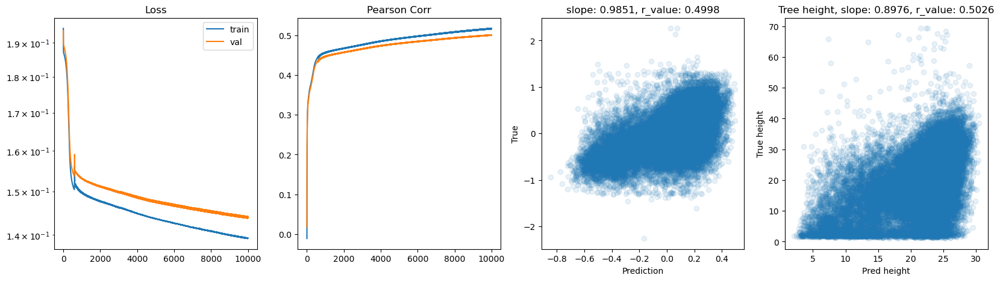


hid_dim: 128, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1958, val_loss: 0.1982, r_value: -0.1142
Epoch 500, train_loss: 0.1867, val_loss: 0.1889, r_value: 0.2522
Epoch 1000, train_loss: 0.1857, val_loss: 0.1880, r_value: 0.3247
Epoch 1500, train_loss: 0.1842, val_loss: 0.1865, r_value: 0.3577
Epoch 2000, train_loss: 0.1815, val_loss: 0.1838, r_value: 0.3784
Epoch 2500, train_loss: 0.1763, val_loss: 0.1788, r_value: 0.3911
Epoch 3000, train_loss: 0.1677, val_loss: 0.1704, r_value: 0.4011
Epoch 3500, train_loss: 0.1589, val_loss: 0.1618, r_value: 0.4088
Epoch 4000, train_loss: 0.1547, val_loss: 0.1577, r_value: 0.4155
Epoch 4500, train_loss: 0.1532, val_loss: 0.1563, r_value: 0.4206
Epoch 5000, train_loss: 0.1524, val_loss: 0.1556, r_value: 0.4244
Epoch 5500, train_loss: 0.1519, val_loss: 0.1551, r_value: 0.4275
Epoch 6000, train_loss: 0.1514, val_loss: 0.1547, r_value: 0.4301
Epoch 6500, train_loss: 0.1510, val_loss: 0.1543, r_value: 0.4325
Epoch 7000, train_loss: 0.1506,

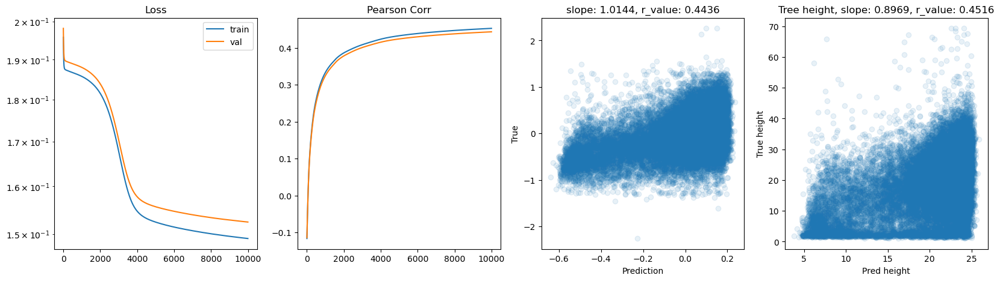


hid_dim: 256, lr: 0.75
Deleting previous model
Epoch 0, train_loss: 0.1926, val_loss: 0.1972, r_value: 0.1144
Epoch 500, train_loss: 0.1599, val_loss: 0.1659, r_value: 0.4216
Epoch 1000, train_loss: 0.1579, val_loss: 0.1624, r_value: 0.4433
Epoch 1500, train_loss: 0.1561, val_loss: 0.1597, r_value: 0.4586
Epoch 2000, train_loss: 0.1545, val_loss: 0.1574, r_value: 0.4696
Epoch 2500, train_loss: 0.1522, val_loss: 0.1570, r_value: 0.4753
Epoch 3000, train_loss: 0.1510, val_loss: 0.1552, r_value: 0.4811
Epoch 3500, train_loss: 0.1513, val_loss: 0.1565, r_value: 0.4832
Epoch 4000, train_loss: 0.1483, val_loss: 0.1534, r_value: 0.4871
Epoch 4500, train_loss: 0.1486, val_loss: 0.1542, r_value: 0.4892
Epoch 5000, train_loss: 0.1467, val_loss: 0.1524, r_value: 0.4942
Epoch 5500, train_loss: 0.1531, val_loss: 0.1433, r_value: 0.4959
Epoch 6000, train_loss: 0.1439, val_loss: 0.1480, r_value: 0.5007
Epoch 6500, train_loss: 0.1388, val_loss: 0.1462, r_value: 0.5025
Epoch 7000, train_loss: 0.1424, 

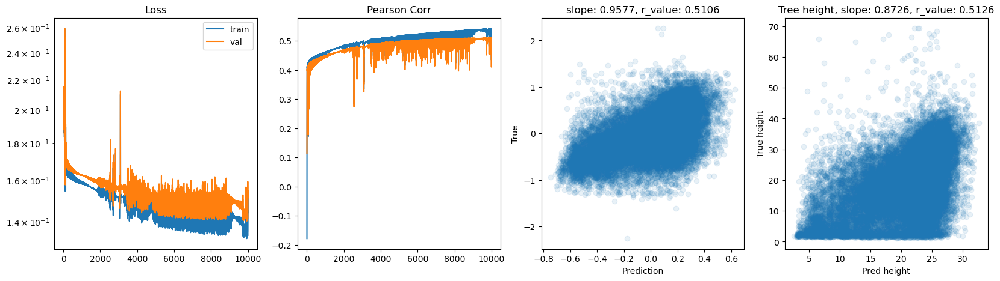


hid_dim: 256, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1872, val_loss: 0.1892, r_value: 0.3429
Epoch 500, train_loss: 0.1542, val_loss: 0.1564, r_value: 0.4438
Epoch 1000, train_loss: 0.1512, val_loss: 0.1543, r_value: 0.4561
Epoch 1500, train_loss: 0.1485, val_loss: 0.1529, r_value: 0.4677
Epoch 2000, train_loss: 0.1463, val_loss: 0.1512, r_value: 0.4756
Epoch 2500, train_loss: 0.1451, val_loss: 0.1489, r_value: 0.4827
Epoch 3000, train_loss: 0.1425, val_loss: 0.1477, r_value: 0.4925
Epoch 3500, train_loss: 0.1397, val_loss: 0.1446, r_value: 0.4909
Epoch 4000, train_loss: 0.1383, val_loss: 0.1437, r_value: 0.4964
Epoch 4500, train_loss: 0.1409, val_loss: 0.1462, r_value: 0.5037
Epoch 5000, train_loss: 0.1380, val_loss: 0.1424, r_value: 0.5044
Epoch 5500, train_loss: 0.1391, val_loss: 0.1443, r_value: 0.5017
Epoch 6000, train_loss: 0.1391, val_loss: 0.1452, r_value: 0.5091
Epoch 6500, train_loss: 0.1392, val_loss: 0.1456, r_value: 0.5102
Epoch 7000, train_loss: 0.1372, v

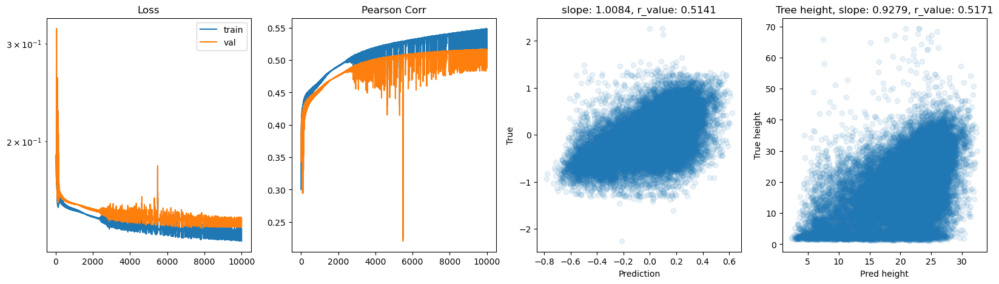


hid_dim: 256, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1894, val_loss: 0.1906, r_value: -0.1758
Epoch 500, train_loss: 0.1512, val_loss: 0.1544, r_value: 0.4400
Epoch 1000, train_loss: 0.1491, val_loss: 0.1526, r_value: 0.4494
Epoch 1500, train_loss: 0.1480, val_loss: 0.1516, r_value: 0.4552
Epoch 2000, train_loss: 0.1470, val_loss: 0.1508, r_value: 0.4604
Epoch 2500, train_loss: 0.1462, val_loss: 0.1500, r_value: 0.4653
Epoch 3000, train_loss: 0.1453, val_loss: 0.1493, r_value: 0.4702
Epoch 3500, train_loss: 0.1445, val_loss: 0.1486, r_value: 0.4746
Epoch 4000, train_loss: 0.1438, val_loss: 0.1480, r_value: 0.4786
Epoch 4500, train_loss: 0.1431, val_loss: 0.1474, r_value: 0.4822
Epoch 5000, train_loss: 0.1424, val_loss: 0.1468, r_value: 0.4856
Epoch 5500, train_loss: 0.1418, val_loss: 0.1462, r_value: 0.4887
Epoch 6000, train_loss: 0.1413, val_loss: 0.1458, r_value: 0.4917
Epoch 6500, train_loss: 0.1407, val_loss: 0.1453, r_value: 0.4945
Epoch 7000, train_loss: 0.1402, 

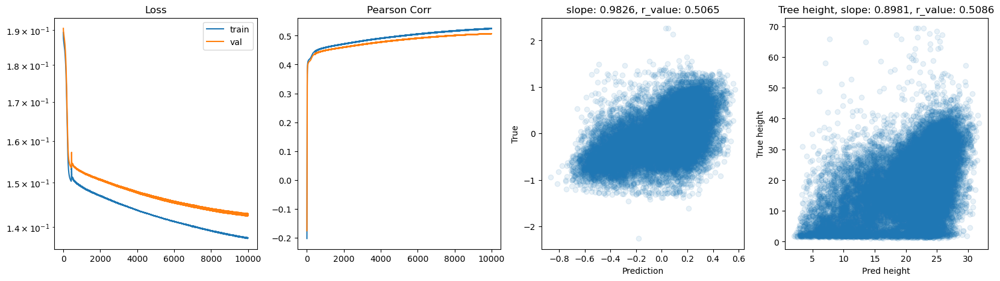


hid_dim: 256, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1893, val_loss: 0.1911, r_value: 0.0666
Epoch 500, train_loss: 0.1849, val_loss: 0.1872, r_value: 0.4003
Epoch 1000, train_loss: 0.1812, val_loss: 0.1836, r_value: 0.4107
Epoch 1500, train_loss: 0.1736, val_loss: 0.1761, r_value: 0.4155
Epoch 2000, train_loss: 0.1613, val_loss: 0.1641, r_value: 0.4214
Epoch 2500, train_loss: 0.1535, val_loss: 0.1565, r_value: 0.4275
Epoch 3000, train_loss: 0.1514, val_loss: 0.1545, r_value: 0.4324
Epoch 3500, train_loss: 0.1507, val_loss: 0.1538, r_value: 0.4354
Epoch 4000, train_loss: 0.1502, val_loss: 0.1534, r_value: 0.4378
Epoch 4500, train_loss: 0.1499, val_loss: 0.1531, r_value: 0.4398
Epoch 5000, train_loss: 0.1495, val_loss: 0.1528, r_value: 0.4416
Epoch 5500, train_loss: 0.1492, val_loss: 0.1525, r_value: 0.4434
Epoch 6000, train_loss: 0.1489, val_loss: 0.1522, r_value: 0.4449
Epoch 6500, train_loss: 0.1487, val_loss: 0.1520, r_value: 0.4463
Epoch 7000, train_loss: 0.1484, 

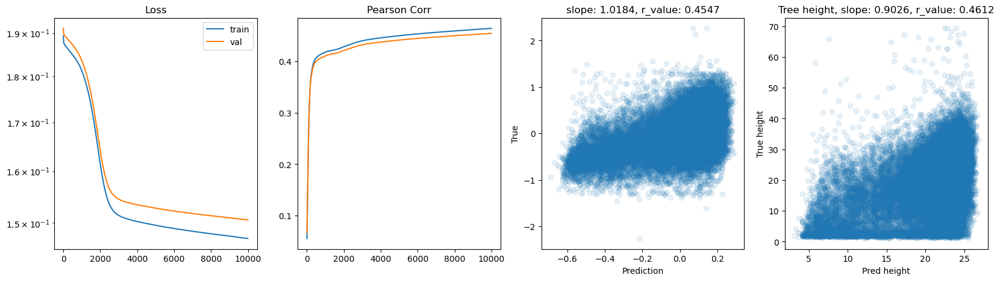


hid_dim: 512, lr: 0.75
Deleting previous model
Epoch 0, train_loss: 0.1911, val_loss: 0.1989, r_value: 0.1924
Epoch 500, train_loss: 0.1591, val_loss: 0.1659, r_value: 0.4180
Epoch 1000, train_loss: 0.1572, val_loss: 0.1622, r_value: 0.4439
Epoch 1500, train_loss: 0.1542, val_loss: 0.1583, r_value: 0.4637
Epoch 2000, train_loss: 0.1511, val_loss: 0.1550, r_value: 0.4734
Epoch 2500, train_loss: 0.1489, val_loss: 0.1531, r_value: 0.4817
Epoch 3000, train_loss: 0.1495, val_loss: 0.1541, r_value: 0.4831
Epoch 3500, train_loss: 0.1482, val_loss: 0.1527, r_value: 0.4892
Epoch 4000, train_loss: 0.1474, val_loss: 0.1504, r_value: 0.4873
Epoch 4500, train_loss: 0.1439, val_loss: 0.1491, r_value: 0.4986
Epoch 5000, train_loss: 0.2298, val_loss: 0.1891, r_value: 0.4408
Epoch 5500, train_loss: 0.1429, val_loss: 0.1466, r_value: 0.5035
Epoch 6000, train_loss: 0.1417, val_loss: 0.1482, r_value: 0.5068
Epoch 6500, train_loss: 0.1392, val_loss: 0.1470, r_value: 0.5058
Epoch 7000, train_loss: 0.1375, 

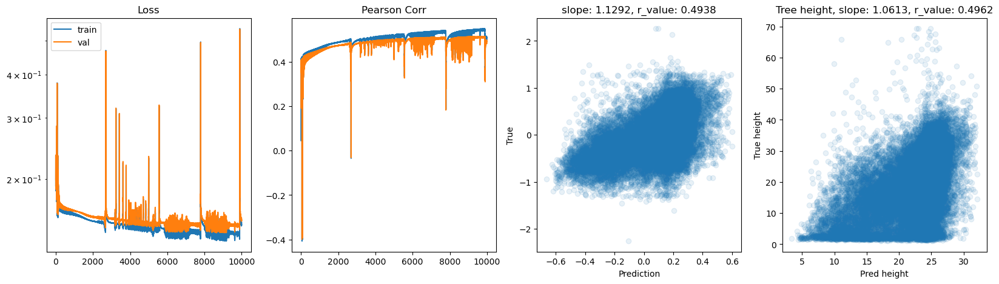


hid_dim: 512, lr: 0.5
Deleting previous model
Epoch 0, train_loss: 0.1882, val_loss: 0.1895, r_value: 0.2176
Epoch 500, train_loss: 0.1522, val_loss: 0.1568, r_value: 0.4402
Epoch 1000, train_loss: 0.1492, val_loss: 0.1526, r_value: 0.4652
Epoch 1500, train_loss: 0.1430, val_loss: 0.1475, r_value: 0.4776
Epoch 2000, train_loss: 0.1437, val_loss: 0.1493, r_value: 0.4893
Epoch 2500, train_loss: 0.1472, val_loss: 0.1462, r_value: 0.4957
Epoch 3000, train_loss: 0.1433, val_loss: 0.1459, r_value: 0.4863
Epoch 3500, train_loss: 0.1407, val_loss: 0.1454, r_value: 0.5034
Epoch 4000, train_loss: 0.1369, val_loss: 0.1432, r_value: 0.5059
Epoch 4500, train_loss: 0.1402, val_loss: 0.1457, r_value: 0.5102
Epoch 5000, train_loss: 0.1373, val_loss: 0.1431, r_value: 0.5101
Epoch 5500, train_loss: 0.1368, val_loss: 0.1424, r_value: 0.5108
Epoch 6000, train_loss: 0.1379, val_loss: 0.1443, r_value: 0.5139
Epoch 6500, train_loss: 0.1364, val_loss: 0.1445, r_value: 0.5165
Epoch 7000, train_loss: 0.1356, v

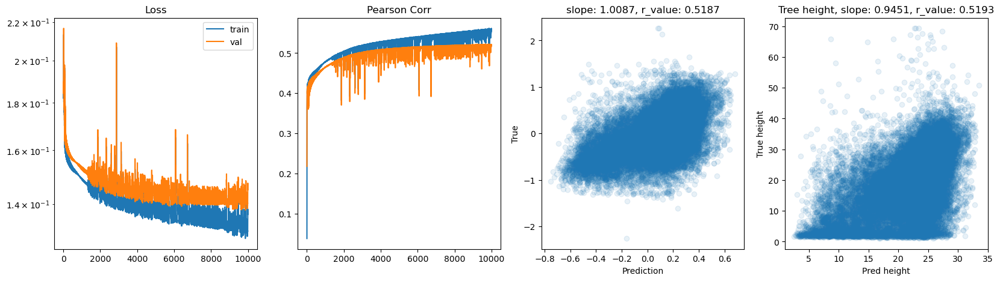


hid_dim: 512, lr: 0.1
Deleting previous model
Epoch 0, train_loss: 0.1912, val_loss: 0.1910, r_value: 0.0375
Epoch 500, train_loss: 0.1503, val_loss: 0.1536, r_value: 0.4428
Epoch 1000, train_loss: 0.1483, val_loss: 0.1517, r_value: 0.4535
Epoch 1500, train_loss: 0.1469, val_loss: 0.1504, r_value: 0.4608
Epoch 2000, train_loss: 0.1457, val_loss: 0.1493, r_value: 0.4672
Epoch 2500, train_loss: 0.1447, val_loss: 0.1483, r_value: 0.4731
Epoch 3000, train_loss: 0.1437, val_loss: 0.1474, r_value: 0.4785
Epoch 3500, train_loss: 0.1429, val_loss: 0.1467, r_value: 0.4831
Epoch 4000, train_loss: 0.1421, val_loss: 0.1460, r_value: 0.4873
Epoch 4500, train_loss: 0.1413, val_loss: 0.1453, r_value: 0.4912
Epoch 5000, train_loss: 0.1405, val_loss: 0.1446, r_value: 0.4949
Epoch 5500, train_loss: 0.1398, val_loss: 0.1440, r_value: 0.4983
Epoch 6000, train_loss: 0.1392, val_loss: 0.1435, r_value: 0.5013
Epoch 6500, train_loss: 0.1385, val_loss: 0.1429, r_value: 0.5039
Epoch 7000, train_loss: 0.1380, v

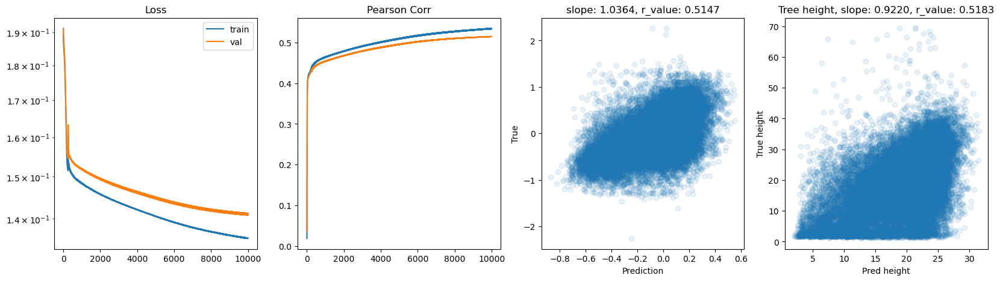


hid_dim: 512, lr: 0.01
Deleting previous model
Epoch 0, train_loss: 0.1910, val_loss: 0.1926, r_value: -0.1958
Epoch 500, train_loss: 0.1840, val_loss: 0.1863, r_value: 0.4082
Epoch 1000, train_loss: 0.1775, val_loss: 0.1799, r_value: 0.4083
Epoch 1500, train_loss: 0.1648, val_loss: 0.1674, r_value: 0.4116
Epoch 2000, train_loss: 0.1549, val_loss: 0.1578, r_value: 0.4197
Epoch 2500, train_loss: 0.1522, val_loss: 0.1552, r_value: 0.4277
Epoch 3000, train_loss: 0.1512, val_loss: 0.1543, r_value: 0.4327
Epoch 3500, train_loss: 0.1506, val_loss: 0.1537, r_value: 0.4363
Epoch 4000, train_loss: 0.1500, val_loss: 0.1532, r_value: 0.4392
Epoch 4500, train_loss: 0.1496, val_loss: 0.1528, r_value: 0.4418
Epoch 5000, train_loss: 0.1492, val_loss: 0.1524, r_value: 0.4439
Epoch 5500, train_loss: 0.1488, val_loss: 0.1521, r_value: 0.4457
Epoch 6000, train_loss: 0.1485, val_loss: 0.1518, r_value: 0.4474
Epoch 6500, train_loss: 0.1483, val_loss: 0.1516, r_value: 0.4489
Epoch 7000, train_loss: 0.1480,

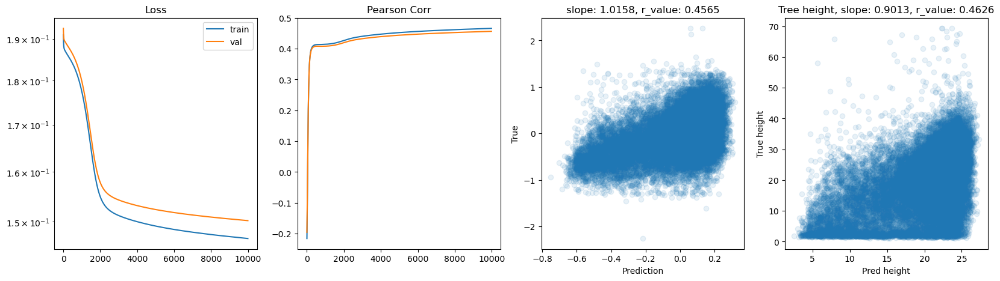

In [ ]:
# model.train()
epoch = 10000
hid_dim_range = [128,256,512]
lr_range = [0.75,0.5,0.1,0.01]

for hid_dim in hid_dim_range:
    for lr in lr_range:
        print('\nhid_dim: {}, lr: {}'.format(hid_dim, lr))
        if 'model' in globals():
            print('Deleting previous model')
            del model, criterion, optimizer
        model = Feedforward(data.shape[1], hid_dim).to(device)
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.SGD(model.parameters(), lr = lr)

        all_loss_train=[]
        all_loss_val=[]
        all_r_train=[]
        all_r_val=[]

        for epoch in range(epoch):
            model.train()
            optimizer.zero_grad()
            # Forward pass
            y_pred = model(X_train.to(device))
            # Compute Loss
            loss = criterion(y_pred.squeeze(), y_train.to(device))

            # Backward pass
            loss.backward()
            optimizer.step()

            all_loss_train.append(loss.item())
            y_pred = y_pred.cpu().detach().numpy().squeeze()
            _, _, r_value_train, _, _ = scipy.stats.linregress(y_pred, y_train)
            all_r_train.append(r_value_train)

            model.eval()
            with torch.no_grad():
                y_pred = model(X_test.to(device))
                # Compute Loss
                loss = criterion(y_pred.squeeze(), y_test.to(device))
                all_loss_val.append(loss.item())

                y_pred = y_pred.cpu().detach().numpy().squeeze()
                slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred, y_test)
                all_r_val.append(r_value)

                if epoch%500==0:
                    print('Epoch {}, train_loss: {:.4f}, val_loss: {:.4f}, r_value: {:.4f}'.format(epoch,all_loss_train[-1],all_loss_val[-1],r_value))

        fig,ax=plt.subplots(1,4,figsize=(20,5))
        ax[0].plot(all_loss_train)
        ax[0].plot(all_loss_val)
        ax[0].semilogy()
        ax[0].set_title('Loss')
        ax[0].legend(['train','val'])

        ax[1].plot(all_r_train)
        ax[1].plot(all_r_val)
        ax[1].set_title('Pearson Corr')

        ax[2].scatter(y_pred, y_test.cpu(), alpha=0.1)
        ax[2].set_xlabel('Prediction')
        ax[2].set_ylabel('True')
        ax[2].set_title('slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))

        # Inverse the transformations back to the tree height
        tree_height_reversed = inverse_normalization(y_test.cpu().reshape(-1, 1), qt, scaler_tree, q99)
        pred_tree_heigth_reversed = inverse_normalization(y_pred.reshape(-1, 1), qt, scaler_tree, q99)
        slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(pred_tree_heigth_reversed, tree_height_reversed)
        ax[3].scatter(pred_tree_heigth_reversed, tree_height_reversed, alpha=0.1)
        ax[3].set_xlabel('Pred height')
        ax[3].set_ylabel('True height')
        ax[3].set_title('Tree height, slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))

        plt.show()

Let's try using batches and switch to Adam optimizer


hid_dim: 128, lr: 0.001
Deleting previous model
Epoch 0, train_loss: 0.1842, val_loss: 0.1767, r_value: 0.4105
Epoch 10, train_loss: 0.1452, val_loss: 0.1479, r_value: 0.4712
Epoch 20, train_loss: 0.1403, val_loss: 0.1439, r_value: 0.4928
Epoch 30, train_loss: 0.1382, val_loss: 0.1424, r_value: 0.5009
Epoch 40, train_loss: 0.1362, val_loss: 0.1411, r_value: 0.5069
Epoch 50, train_loss: 0.1351, val_loss: 0.1409, r_value: 0.5100
Epoch 60, train_loss: 0.1341, val_loss: 0.1411, r_value: 0.5097
Epoch 70, train_loss: 0.1331, val_loss: 0.1401, r_value: 0.5120
Epoch 80, train_loss: 0.1320, val_loss: 0.1395, r_value: 0.5156
Epoch 90, train_loss: 0.1319, val_loss: 0.1392, r_value: 0.5172
Epoch 100, train_loss: 0.1310, val_loss: 0.1397, r_value: 0.5171
Epoch 110, train_loss: 0.1300, val_loss: 0.1395, r_value: 0.5173
Epoch 120, train_loss: 0.1295, val_loss: 0.1396, r_value: 0.5174
Epoch 130, train_loss: 0.1283, val_loss: 0.1393, r_value: 0.5167
Epoch 140, train_loss: 0.1282, val_loss: 0.1402, r_v

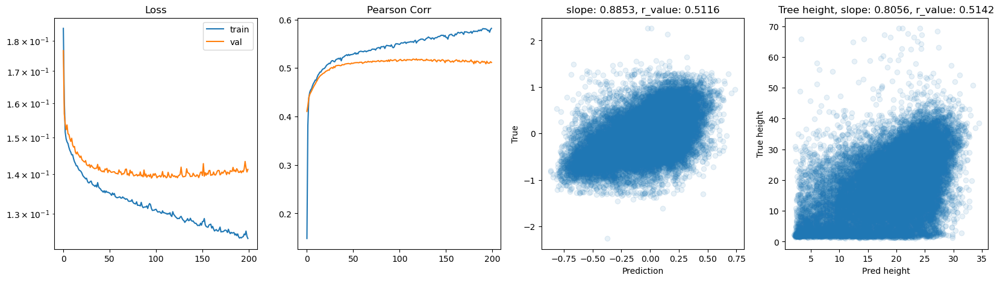


hid_dim: 128, lr: 0.0005
Deleting previous model
Epoch 0, train_loss: 0.1879, val_loss: 0.1863, r_value: 0.3873
Epoch 10, train_loss: 0.1453, val_loss: 0.1490, r_value: 0.4643
Epoch 20, train_loss: 0.1408, val_loss: 0.1450, r_value: 0.4863
Epoch 30, train_loss: 0.1385, val_loss: 0.1428, r_value: 0.4975
Epoch 40, train_loss: 0.1369, val_loss: 0.1419, r_value: 0.5045
Epoch 50, train_loss: 0.1362, val_loss: 0.1412, r_value: 0.5090
Epoch 60, train_loss: 0.1350, val_loss: 0.1403, r_value: 0.5111
Epoch 70, train_loss: 0.1344, val_loss: 0.1406, r_value: 0.5114
Epoch 80, train_loss: 0.1337, val_loss: 0.1397, r_value: 0.5141
Epoch 90, train_loss: 0.1332, val_loss: 0.1396, r_value: 0.5149
Epoch 100, train_loss: 0.1325, val_loss: 0.1393, r_value: 0.5157
Epoch 110, train_loss: 0.1324, val_loss: 0.1392, r_value: 0.5168
Epoch 120, train_loss: 0.1319, val_loss: 0.1393, r_value: 0.5163
Epoch 130, train_loss: 0.1313, val_loss: 0.1389, r_value: 0.5186
Epoch 140, train_loss: 0.1307, val_loss: 0.1390, r_

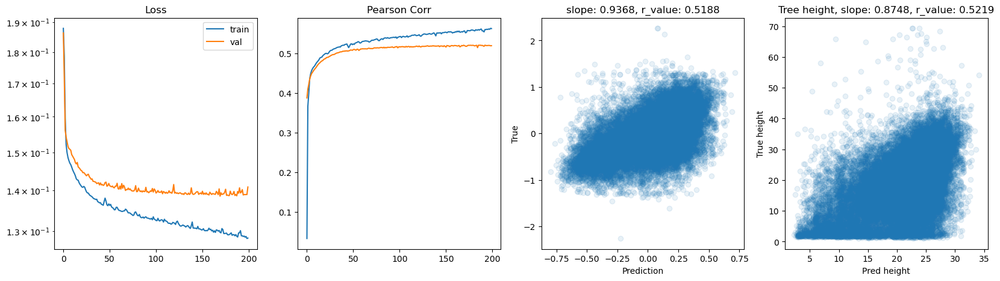


hid_dim: 128, lr: 0.0001
Deleting previous model
Epoch 0, train_loss: 0.1880, val_loss: 0.1885, r_value: 0.3209
Epoch 10, train_loss: 0.1500, val_loss: 0.1529, r_value: 0.4416
Epoch 20, train_loss: 0.1472, val_loss: 0.1504, r_value: 0.4555
Epoch 30, train_loss: 0.1456, val_loss: 0.1490, r_value: 0.4640
Epoch 40, train_loss: 0.1436, val_loss: 0.1472, r_value: 0.4741
Epoch 50, train_loss: 0.1417, val_loss: 0.1459, r_value: 0.4833
Epoch 60, train_loss: 0.1402, val_loss: 0.1443, r_value: 0.4896
Epoch 70, train_loss: 0.1391, val_loss: 0.1436, r_value: 0.4944
Epoch 80, train_loss: 0.1382, val_loss: 0.1428, r_value: 0.4986
Epoch 90, train_loss: 0.1374, val_loss: 0.1421, r_value: 0.5017
Epoch 100, train_loss: 0.1379, val_loss: 0.1417, r_value: 0.5039
Epoch 110, train_loss: 0.1364, val_loss: 0.1414, r_value: 0.5054
Epoch 120, train_loss: 0.1359, val_loss: 0.1410, r_value: 0.5071
Epoch 130, train_loss: 0.1355, val_loss: 0.1408, r_value: 0.5084
Epoch 140, train_loss: 0.1353, val_loss: 0.1409, r_

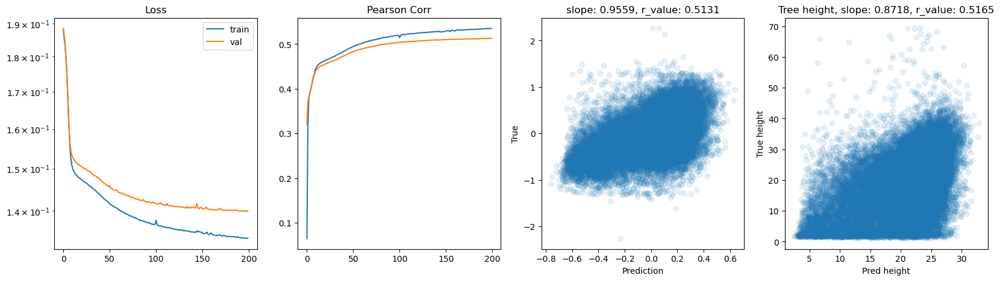


hid_dim: 256, lr: 0.001
Deleting previous model
Epoch 0, train_loss: 0.1685, val_loss: 0.1566, r_value: 0.4320
Epoch 10, train_loss: 0.1414, val_loss: 0.1453, r_value: 0.4874
Epoch 20, train_loss: 0.1373, val_loss: 0.1420, r_value: 0.5090
Epoch 30, train_loss: 0.1349, val_loss: 0.1412, r_value: 0.5133
Epoch 40, train_loss: 0.1310, val_loss: 0.1385, r_value: 0.5212
Epoch 50, train_loss: 0.1297, val_loss: 0.1385, r_value: 0.5217
Epoch 60, train_loss: 0.1277, val_loss: 0.1392, r_value: 0.5195
Epoch 70, train_loss: 0.1264, val_loss: 0.1428, r_value: 0.5146
Epoch 80, train_loss: 0.1249, val_loss: 0.1413, r_value: 0.5153
Epoch 90, train_loss: 0.1229, val_loss: 0.1403, r_value: 0.5156
Epoch 100, train_loss: 0.1231, val_loss: 0.1410, r_value: 0.5103
Epoch 110, train_loss: 0.1171, val_loss: 0.1423, r_value: 0.5047
Epoch 120, train_loss: 0.1180, val_loss: 0.1436, r_value: 0.4961
Epoch 130, train_loss: 0.1126, val_loss: 0.1462, r_value: 0.5055
Epoch 140, train_loss: 0.1102, val_loss: 0.1477, r_v

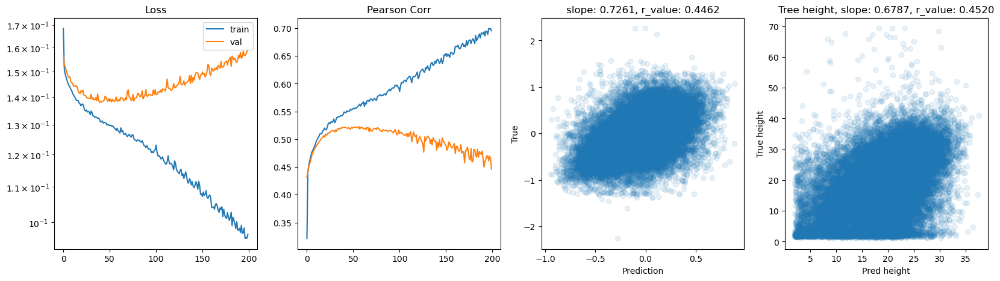


hid_dim: 256, lr: 0.0005
Deleting previous model
Epoch 0, train_loss: 0.1760, val_loss: 0.1597, r_value: 0.4158
Epoch 10, train_loss: 0.1425, val_loss: 0.1466, r_value: 0.4795
Epoch 20, train_loss: 0.1388, val_loss: 0.1427, r_value: 0.4984
Epoch 30, train_loss: 0.1357, val_loss: 0.1417, r_value: 0.5081
Epoch 40, train_loss: 0.1349, val_loss: 0.1406, r_value: 0.5099
Epoch 50, train_loss: 0.1322, val_loss: 0.1395, r_value: 0.5161
Epoch 60, train_loss: 0.1311, val_loss: 0.1390, r_value: 0.5190
Epoch 70, train_loss: 0.1299, val_loss: 0.1395, r_value: 0.5161
Epoch 80, train_loss: 0.1286, val_loss: 0.1388, r_value: 0.5189
Epoch 90, train_loss: 0.1279, val_loss: 0.1389, r_value: 0.5183
Epoch 100, train_loss: 0.1268, val_loss: 0.1389, r_value: 0.5206
Epoch 110, train_loss: 0.1266, val_loss: 0.1397, r_value: 0.5160
Epoch 120, train_loss: 0.1250, val_loss: 0.1397, r_value: 0.5156
Epoch 130, train_loss: 0.1227, val_loss: 0.1403, r_value: 0.5159
Epoch 140, train_loss: 0.1215, val_loss: 0.1403, r_

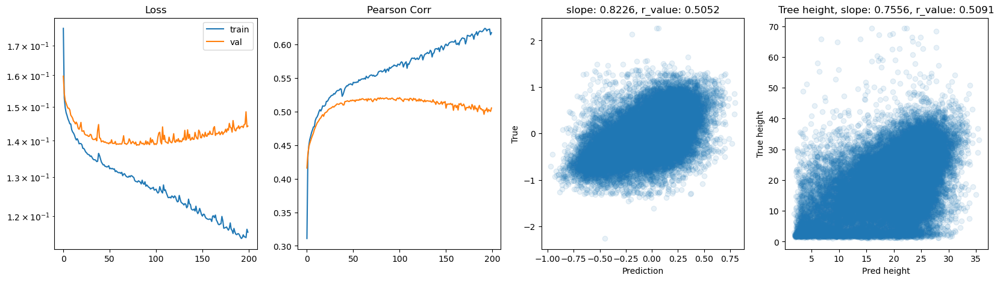


hid_dim: 256, lr: 0.0001
Deleting previous model
Epoch 0, train_loss: 0.1874, val_loss: 0.1875, r_value: 0.3724
Epoch 10, train_loss: 0.1476, val_loss: 0.1509, r_value: 0.4533
Epoch 20, train_loss: 0.1447, val_loss: 0.1481, r_value: 0.4690
Epoch 30, train_loss: 0.1421, val_loss: 0.1463, r_value: 0.4816
Epoch 40, train_loss: 0.1400, val_loss: 0.1442, r_value: 0.4905
Epoch 50, train_loss: 0.1385, val_loss: 0.1432, r_value: 0.4967
Epoch 60, train_loss: 0.1372, val_loss: 0.1423, r_value: 0.5018
Epoch 70, train_loss: 0.1362, val_loss: 0.1415, r_value: 0.5060
Epoch 80, train_loss: 0.1352, val_loss: 0.1408, r_value: 0.5088
Epoch 90, train_loss: 0.1350, val_loss: 0.1405, r_value: 0.5115
Epoch 100, train_loss: 0.1337, val_loss: 0.1400, r_value: 0.5135
Epoch 110, train_loss: 0.1330, val_loss: 0.1395, r_value: 0.5146
Epoch 120, train_loss: 0.1330, val_loss: 0.1398, r_value: 0.5153
Epoch 130, train_loss: 0.1320, val_loss: 0.1396, r_value: 0.5167
Epoch 140, train_loss: 0.1316, val_loss: 0.1392, r_

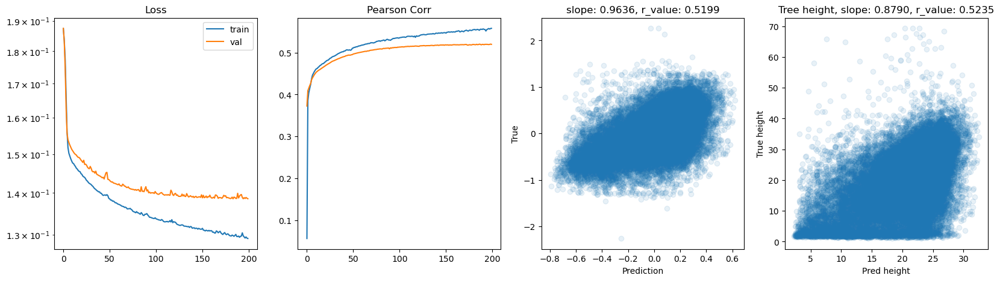


hid_dim: 512, lr: 0.001
Deleting previous model
Epoch 0, train_loss: 0.1709, val_loss: 0.1582, r_value: 0.4272
Epoch 10, train_loss: 0.1395, val_loss: 0.1447, r_value: 0.4949
Epoch 20, train_loss: 0.1354, val_loss: 0.1402, r_value: 0.5125
Epoch 30, train_loss: 0.1327, val_loss: 0.1392, r_value: 0.5179
Epoch 40, train_loss: 0.1300, val_loss: 0.1407, r_value: 0.5178
Epoch 50, train_loss: 0.1259, val_loss: 0.1395, r_value: 0.5182
Epoch 60, train_loss: 0.1219, val_loss: 0.1397, r_value: 0.5174
Epoch 70, train_loss: 0.1178, val_loss: 0.1418, r_value: 0.5143
Epoch 80, train_loss: 0.1091, val_loss: 0.1471, r_value: 0.5045
Epoch 90, train_loss: 0.1010, val_loss: 0.1555, r_value: 0.4833
Epoch 100, train_loss: 0.0947, val_loss: 0.1550, r_value: 0.4711
Epoch 110, train_loss: 0.0843, val_loss: 0.1636, r_value: 0.4554
Epoch 120, train_loss: 0.0760, val_loss: 0.1672, r_value: 0.4506
Epoch 130, train_loss: 0.0707, val_loss: 0.1753, r_value: 0.4535
Epoch 140, train_loss: 0.0662, val_loss: 0.1811, r_v

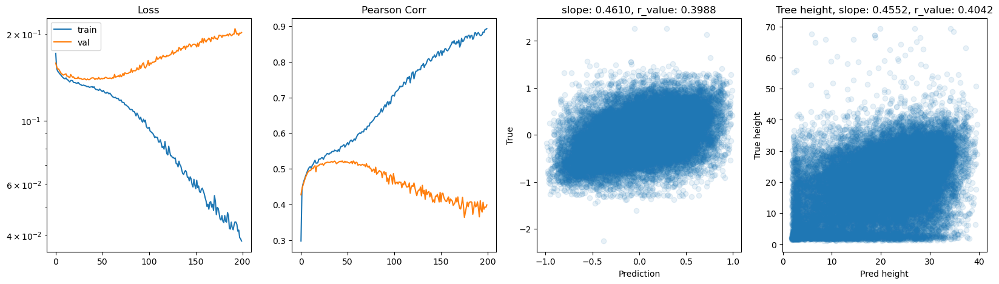


hid_dim: 512, lr: 0.0005
Deleting previous model
Epoch 0, train_loss: 0.1666, val_loss: 0.1557, r_value: 0.4304
Epoch 10, train_loss: 0.1402, val_loss: 0.1440, r_value: 0.4919
Epoch 20, train_loss: 0.1357, val_loss: 0.1405, r_value: 0.5096
Epoch 30, train_loss: 0.1338, val_loss: 0.1400, r_value: 0.5143
Epoch 40, train_loss: 0.1311, val_loss: 0.1392, r_value: 0.5185
Epoch 50, train_loss: 0.1291, val_loss: 0.1388, r_value: 0.5201
Epoch 60, train_loss: 0.1272, val_loss: 0.1401, r_value: 0.5204
Epoch 70, train_loss: 0.1242, val_loss: 0.1392, r_value: 0.5185
Epoch 80, train_loss: 0.1214, val_loss: 0.1404, r_value: 0.5188
Epoch 90, train_loss: 0.1185, val_loss: 0.1414, r_value: 0.5093
Epoch 100, train_loss: 0.1148, val_loss: 0.1421, r_value: 0.5116
Epoch 110, train_loss: 0.1116, val_loss: 0.1436, r_value: 0.4985
Epoch 120, train_loss: 0.1100, val_loss: 0.1500, r_value: 0.5082
Epoch 130, train_loss: 0.1038, val_loss: 0.1478, r_value: 0.4909
Epoch 140, train_loss: 0.0997, val_loss: 0.1514, r_

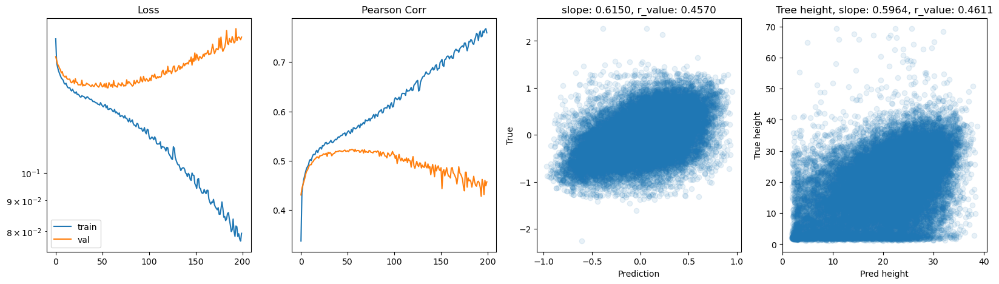


hid_dim: 512, lr: 0.0001
Deleting previous model
Epoch 0, train_loss: 0.1847, val_loss: 0.1811, r_value: 0.4059
Epoch 10, train_loss: 0.1459, val_loss: 0.1496, r_value: 0.4648
Epoch 20, train_loss: 0.1416, val_loss: 0.1457, r_value: 0.4846
Epoch 30, train_loss: 0.1385, val_loss: 0.1429, r_value: 0.4982
Epoch 40, train_loss: 0.1360, val_loss: 0.1416, r_value: 0.5072
Epoch 50, train_loss: 0.1348, val_loss: 0.1408, r_value: 0.5113
Epoch 60, train_loss: 0.1337, val_loss: 0.1398, r_value: 0.5141
Epoch 70, train_loss: 0.1323, val_loss: 0.1393, r_value: 0.5156
Epoch 80, train_loss: 0.1313, val_loss: 0.1395, r_value: 0.5179
Epoch 90, train_loss: 0.1306, val_loss: 0.1388, r_value: 0.5192
Epoch 100, train_loss: 0.1306, val_loss: 0.1392, r_value: 0.5183
Epoch 110, train_loss: 0.1295, val_loss: 0.1391, r_value: 0.5197
Epoch 120, train_loss: 0.1283, val_loss: 0.1385, r_value: 0.5213
Epoch 130, train_loss: 0.1281, val_loss: 0.1386, r_value: 0.5210
Epoch 140, train_loss: 0.1270, val_loss: 0.1391, r_

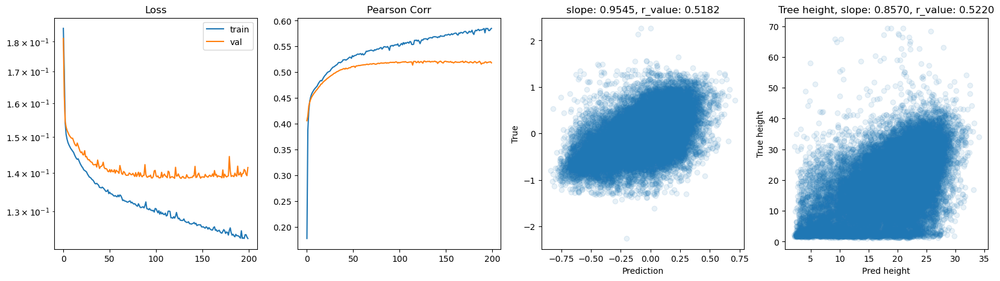

In [ ]:
from torch.utils.data import TensorDataset, DataLoader
import os
# Hyperparams
batch_size = 5000  # requested
num_epochs = 200  # same semantics as before
hid_dim_range = [128, 256, 512]
# Adam works best with smaller lrs; consider tuning like [1e-3, 5e-4, 1e-4]
lr_range = [1e-3, 5e-4, 1e-4]

# DataLoaders with performance knobs
# - num_workers ~ half your CPU cores
# - pin_memory True to accelerate H2D when using non_blocking .to(...)
# - persistent_workers keeps worker processes across epochs
# - prefetch_factor helps overlap data prep with GPU work
# - drop_last avoids tiny last batch that can introduce variance
train_ds = TensorDataset(X_train, y_train)
val_ds = TensorDataset(X_test, y_test)
train_loader = DataLoader(
    train_ds,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
    drop_last=False,
)
val_loader = DataLoader(
    val_ds,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True,
    drop_last=False,
)

for hid_dim in hid_dim_range:
    for lr in lr_range:
        print(f'\nhid_dim: {hid_dim}, lr: {lr}')
        if 'model' in globals():
            print('Deleting previous model')
            del model, criterion, optimizer

        model = Feedforward(data.shape[1], hid_dim).to(device)
        criterion = torch.nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        all_loss_train, all_loss_val = [], []
        all_r_train, all_r_val = [], []

        for epoch in range(num_epochs):
            model.train()
            epoch_loss = 0.0

            # Accumulate predictions/targets only once per epoch (post-batch) to compute Pearson r
            preds_train_all = []
            targets_train_all = []

            for xb, yb in train_loader:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)

                optimizer.zero_grad(set_to_none=True)  # more efficient zeroing
                y_pred_b = model(xb)
                loss = criterion(y_pred_b.squeeze(), yb)
                loss.backward()
                optimizer.step()

                # Keep running sum of loss (on CPU scalar)
                epoch_loss += loss.item() * xb.size(0)

                # Collect for train metrics once per epoch (avoid per-batch CPU conversions)
                preds_train_all.append(y_pred_b.detach().cpu())
                targets_train_all.append(yb.detach().cpu())

            # End of epoch: compute train metrics
            y_pred_train = torch.cat(preds_train_all, dim=0).numpy().squeeze()
            y_true_train = torch.cat(targets_train_all, dim=0).numpy().squeeze()
            mean_train_loss = epoch_loss / len(train_ds)
            all_loss_train.append(mean_train_loss)

            try:
                _, _, r_value_train, _, _ = scipy.stats.linregress(y_pred_train, y_true_train)
            except Exception:
                r_value_train = np.nan
            all_r_train.append(r_value_train)

            # Validation
            model.eval()
            val_loss_accum = 0.0
            preds_val_all = []
            targets_val_all = []
            with torch.no_grad():
                for xb, yb in val_loader:
                    xb = xb.to(device, non_blocking=True)
                    yb = yb.to(device, non_blocking=True)
                    y_pred_b = model(xb)
                    loss_b = criterion(y_pred_b.squeeze(), yb)
                    val_loss_accum += loss_b.item() * xb.size(0)
                    preds_val_all.append(y_pred_b.detach().cpu())
                    targets_val_all.append(yb.detach().cpu())

            y_pred_val = torch.cat(preds_val_all, dim=0).numpy().squeeze()
            y_true_val = torch.cat(targets_val_all, dim=0).numpy().squeeze()
            mean_val_loss = val_loss_accum / len(val_ds)
            all_loss_val.append(mean_val_loss)

            try:
                slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred_val, y_true_val)
            except Exception:
                r_value = np.nan
            all_r_val.append(r_value)

            # Throttle logging
            if epoch % 10 == 0:
                print(f'Epoch {epoch}, train_loss: {mean_train_loss:.4f}, val_loss: {mean_val_loss:.4f}, r_value: {r_value:.4f}')

        # Plotting (uses last epoch's arrays)
        fig, ax = plt.subplots(1, 4, figsize=(20, 5))
        ax[0].plot(all_loss_train)
        ax[0].plot(all_loss_val)
        ax[0].semilogy()
        ax[0].set_title('Loss')
        ax[0].legend(['train', 'val'])

        ax[1].plot(all_r_train)
        ax[1].plot(all_r_val)
        ax[1].set_title('Pearson Corr')

        ax[2].scatter(y_pred_val, y_true_val, alpha=0.1)
        ax[2].set_xlabel('Prediction')
        ax[2].set_ylabel('True')
        ax[2].set_title(f'slope: {slope:.4f}, r_value: {r_value:.4f}')

        # Inverse transformation on validation
        tree_height_reversed = inverse_normalization(y_true_val.reshape(-1, 1), qt, scaler_tree, q99)
        pred_tree_heigth_reversed = inverse_normalization(y_pred_val.reshape(-1, 1), qt, scaler_tree, q99)
        slope2, intercept2, r_value2, p_value2, std_err2 = scipy.stats.linregress(pred_tree_heigth_reversed, tree_height_reversed)
        ax[3].scatter(pred_tree_heigth_reversed, tree_height_reversed, alpha=0.1)
        ax[3].set_xlabel('Pred height')
        ax[3].set_ylabel('True height')
        ax[3].set_title(f'Tree height, slope: {slope2:.4f}, r_value: {r_value2:.4f}')

        plt.show()


# Let's try the sklearn MLP implementation
sklearn also includes a class for neural network, which is a useful way to train a *simple* MLP quickly

In [ ]:
# Let's try the sklearn MLP implementation
from sklearn.neural_network import MLPRegressor
regr = MLPRegressor(random_state=1, max_iter=1000).fit(X_train, y_train)
print(regr)

MLPRegressor(max_iter=1000, random_state=1)


Text(0.5, 1.0, 'slope: 0.9888, r_value: 0.5085')

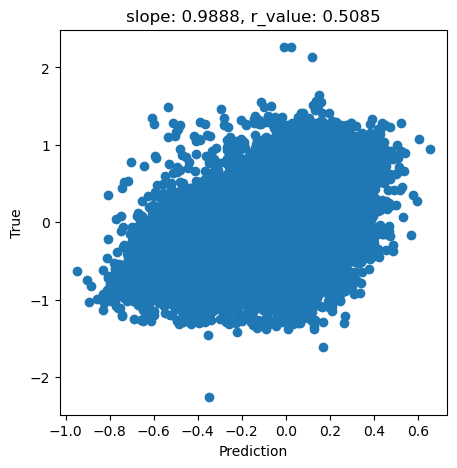

In [ ]:
y_pred = regr.predict(X_test)
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred, y_test)

fig,ax=plt.subplots(figsize=(5,5))
ax.scatter(y_pred, y_test.cpu())
ax.set_xlabel('Prediction')
ax.set_ylabel('True')
ax.set_title('slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))

In [ ]:
regr = MLPRegressor(hidden_layer_sizes=(256,256,256),random_state=1, max_iter=1000).fit(X_train, y_train)

Text(0.5, 1.0, 'slope: 0.3976, r_value: 0.3469')

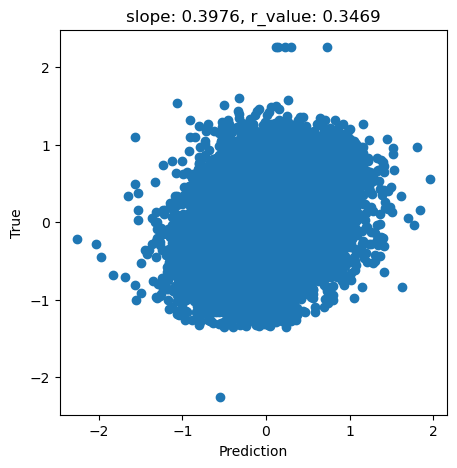

In [ ]:
y_pred = regr.predict(X_test)
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y_pred, y_test)

fig,ax=plt.subplots(figsize=(5,5))
ax.scatter(y_pred, y_test.cpu())
ax.set_xlabel('Prediction')
ax.set_ylabel('True')
ax.set_title('slope: {:.4f}, r_value: {:.4f}'.format(slope, r_value))